In [2]:
# %% [markdown]
# # YOLOv8 Training - Optimized Setup

# %% [code]
# Clean installation
!pip uninstall -y pylibraft-cu12 rmm-cu12 pylibcugraph-cu12 2>/dev/null || echo "No conflicts found"
!pip install ultralytics --no-deps --quiet
!pip install torch==2.0.1 torchvision==0.15.2 --extra-index-url https://download.pytorch.org/whl/cu118 --quiet

# %% [code]
import os
import shutil
from ultralytics import YOLO

# %% [code]
def organize_dataset(source_path, target_dir, split_name):
    """Organizes nested dataset into YOLO format"""
    img_dir = f'{target_dir}/images/{split_name}'
    lbl_dir = f'{target_dir}/labels/{split_name}'
    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(lbl_dir, exist_ok=True)
    
    for root, _, files in os.walk(source_path):
        for file in files:
            src = os.path.join(root, file)
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                shutil.copy(src, f'{img_dir}/{file}')
            elif file.endswith('.txt'):
                shutil.copy(src, f'{lbl_dir}/{file}')

# %% [code]
# Setup paths
dataset_path = '/kaggle/working/yolo_data'
os.makedirs(dataset_path, exist_ok=True)

# Organize data
organize_dataset('/kaggle/input/data-set/train/train/train', dataset_path, 'train')
organize_dataset('/kaggle/input/data-set/valid/valid/valid', dataset_path, 'valid')
organize_dataset('/kaggle/input/data-set/test/test/test', dataset_path, 'test')

# %% [code]
# Create YOLO config
with open(f'{dataset_path}/data.yaml', 'w') as f:
    f.write(f"""
path: {dataset_path}
train: images/train
val: images/valid
test: images/test

names:
  0: plot_hole
  1: defect
""")

# %% [code]
# Verify structure
!tree -L 3 /kaggle/working/yolo_data

# %% [code]
# Train with optimized settings
model = YOLO('yolov8n.pt')
results = model.train(
    data=f'{dataset_path}/data.yaml',
    epochs=50,
    imgsz=640,
    batch=16,
    cache='ram' if not os.path.exists('/kaggle/working/cache') else 'disk',
    workers=2,
    name='yolo_train'
)

# %% [code]
# Save results
!ls /kaggle/working/runs/detect/yolo_train/weights/best.pt

Found existing installation: pylibraft-cu12 25.2.0
Uninstalling pylibraft-cu12-25.2.0:
  Successfully uninstalled pylibraft-cu12-25.2.0
Found existing installation: rmm-cu12 25.2.0
Uninstalling rmm-cu12-25.2.0:
  Successfully uninstalled rmm-cu12-25.2.0
Found existing installation: pylibcugraph-cu12 24.12.0
Uninstalling pylibcugraph-cu12-24.12.0:
  Successfully uninstalled pylibcugraph-cu12-24.12.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 GB 412.9 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 93.5 MB/s eta 0:00:00:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 MB 28.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.4/96.4 kB 2.4 MB/s eta 0:00:00a 0:00:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pytorch-lightning 2.5.1 requires torch>=2.1.0, but you have torch 2.0

train: Scanning /kaggle/working/yolo_data/labels/train.cache... 497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 497/497 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.5GB RAM): 100%|██████████| 497/497 [00:07<00:00, 64.95it/s] 

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2052.5±1916.7 MB/s, size: 1719.5 KB)


val: Scanning /kaggle/working/yolo_data/labels/valid.cache... 93 images, 0 backgrounds, 0 corrupt: 100%|██████████| 93/93 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 93/93 [00:01<00:00, 49.07it/s] 


Plotting labels to runs/detect/yolo_train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolo_train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       2.4G      1.706       2.73      1.472          9        640: 100%|██████████| 32/32 [00:05<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.23it/s]

                   all         93        239    0.00715      0.431     0.0787     0.0401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.65G      1.575      1.836      1.394          2        640: 100%|██████████| 32/32 [00:05<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.09it/s]


                   all         93        239      0.344     0.0962     0.0933     0.0507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.66G      1.528      1.721       1.35          9        640: 100%|██████████| 32/32 [00:04<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.83it/s]

                   all         93        239       0.23      0.335      0.162     0.0683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.66G      1.452      1.531        1.3          3        640: 100%|██████████| 32/32 [00:05<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.61it/s]

                   all         93        239       0.27       0.23      0.173     0.0857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.66G      1.497      1.536      1.312          3        640: 100%|██████████| 32/32 [00:05<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.54it/s]

                   all         93        239      0.399      0.194      0.191     0.0811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.66G      1.387      1.348      1.258         23        640: 100%|██████████| 32/32 [00:05<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.39it/s]

                   all         93        239      0.547      0.293      0.323      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.66G      1.349      1.269      1.244          4        640: 100%|██████████| 32/32 [00:05<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.61it/s]

                   all         93        239      0.561      0.431      0.456      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.66G      1.339      1.214      1.229          5        640: 100%|██████████| 32/32 [00:05<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.48it/s]

                   all         93        239      0.671      0.423      0.508      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.66G      1.285      1.182      1.193          1        640: 100%|██████████| 32/32 [00:05<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.41it/s]

                   all         93        239      0.671      0.397      0.457      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.66G      1.254      1.119      1.179          6        640: 100%|██████████| 32/32 [00:05<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.96it/s]

                   all         93        239      0.702      0.515      0.539      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.66G       1.25      1.088      1.167          4        640: 100%|██████████| 32/32 [00:05<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.56it/s]

                   all         93        239      0.601       0.53      0.512      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.66G      1.229      1.031      1.172          9        640: 100%|██████████| 32/32 [00:05<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.62it/s]

                   all         93        239      0.596      0.536      0.516      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.66G      1.188     0.9575      1.134          4        640: 100%|██████████| 32/32 [00:05<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.62it/s]

                   all         93        239      0.611      0.569       0.56      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.66G      1.212     0.9648      1.142          8        640: 100%|██████████| 32/32 [00:05<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.55it/s]

                   all         93        239      0.578       0.51      0.521      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.66G      1.187      1.138      1.124          1        640: 100%|██████████| 32/32 [00:05<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.49it/s]


                   all         93        239      0.589      0.498      0.493      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.66G      1.122     0.8926      1.106          4        640: 100%|██████████| 32/32 [00:05<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.58it/s]

                   all         93        239      0.582      0.494      0.523      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.66G      1.092     0.8607      1.078         14        640: 100%|██████████| 32/32 [00:05<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.79it/s]

                   all         93        239      0.653      0.559      0.567      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.66G      1.073     0.8632      1.078          5        640: 100%|██████████| 32/32 [00:05<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.49it/s]

                   all         93        239      0.663      0.527      0.566      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.66G      1.047     0.8401      1.078          2        640: 100%|██████████| 32/32 [00:05<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.54it/s]

                   all         93        239      0.659      0.573      0.596      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.66G      1.026     0.7642      1.061          6        640: 100%|██████████| 32/32 [00:05<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.71it/s]

                   all         93        239      0.618      0.636       0.62        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.66G      1.049     0.7719      1.067          3        640: 100%|██████████| 32/32 [00:05<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.64it/s]

                   all         93        239      0.656      0.598       0.58      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.66G     0.9708     0.8275      1.016          0        640: 100%|██████████| 32/32 [00:05<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.64it/s]

                   all         93        239      0.782      0.527      0.613      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.66G     0.9936     0.7477      1.033         13        640: 100%|██████████| 32/32 [00:05<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.87it/s]

                   all         93        239      0.707      0.569      0.587      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.66G      1.007     0.7673       1.05          4        640: 100%|██████████| 32/32 [00:05<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.75it/s]

                   all         93        239      0.675      0.569      0.569      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.66G     0.9635     0.7142      1.033          3        640: 100%|██████████| 32/32 [00:05<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.50it/s]

                   all         93        239      0.711      0.573      0.623      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.66G     0.9594     0.7058      1.027          3        640: 100%|██████████| 32/32 [00:05<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.41it/s]

                   all         93        239      0.756      0.569      0.609      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.66G     0.9825     0.7247      1.038          6        640: 100%|██████████| 32/32 [00:05<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.47it/s]

                   all         93        239      0.746      0.598      0.631      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.66G     0.9231     0.6651      1.016          4        640: 100%|██████████| 32/32 [00:05<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.47it/s]

                   all         93        239      0.677       0.57      0.595      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.66G     0.9161     0.6623      1.015          4        640: 100%|██████████| 32/32 [00:05<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.55it/s]

                   all         93        239      0.656      0.603      0.609      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.66G     0.9069     0.6452       1.01         10        640: 100%|██████████| 32/32 [00:05<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.71it/s]

                   all         93        239      0.708      0.607      0.638      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.66G     0.8989     0.6423      1.014          3        640: 100%|██████████| 32/32 [00:05<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.26it/s]

                   all         93        239      0.663       0.64      0.602      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.66G     0.8878     0.6213     0.9978          9        640: 100%|██████████| 32/32 [00:05<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.82it/s]

                   all         93        239       0.69      0.598       0.59      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.66G     0.8321      0.614     0.9766          1        640: 100%|██████████| 32/32 [00:05<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.53it/s]

                   all         93        239      0.704      0.607      0.618      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.66G     0.8322     0.5784     0.9745          5        640: 100%|██████████| 32/32 [00:05<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.77it/s]

                   all         93        239      0.659      0.603      0.594      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.66G     0.8363     0.5953     0.9893          2        640: 100%|██████████| 32/32 [00:05<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.49it/s]

                   all         93        239      0.742      0.619      0.649      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.66G     0.8374     0.5946      0.983          3        640: 100%|██████████| 32/32 [00:05<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.89it/s]

                   all         93        239      0.784       0.59      0.629       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.66G       0.83     0.5859     0.9711          5        640: 100%|██████████| 32/32 [00:05<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.82it/s]

                   all         93        239      0.622      0.615      0.601      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.66G     0.8177     0.5772     0.9815          3        640: 100%|██████████| 32/32 [00:05<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.55it/s]

                   all         93        239      0.722      0.598      0.613      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.66G     0.7949     0.5639     0.9618          5        640: 100%|██████████| 32/32 [00:05<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.82it/s]

                   all         93        239      0.687      0.615      0.614       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.66G     0.7974     0.5608     0.9652          9        640: 100%|██████████| 32/32 [00:05<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.73it/s]

                   all         93        239       0.75      0.598      0.633      0.337


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.66G      1.303      1.164      1.127          2        640: 100%|██████████| 32/32 [00:05<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.38it/s]

                   all         93        239      0.687      0.541      0.576      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.66G      1.172     0.9782      1.096          1        640: 100%|██████████| 32/32 [00:05<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.34it/s]

                   all         93        239       0.64      0.586      0.578      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.66G      1.098     0.8499      1.052          2        640: 100%|██████████| 32/32 [00:05<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.45it/s]

                   all         93        239      0.715      0.576      0.606      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.66G      1.091     0.8377      1.062          1        640: 100%|██████████| 32/32 [00:05<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.60it/s]

                   all         93        239      0.711      0.607      0.625       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.66G      1.102     0.8326      1.038          5        640: 100%|██████████| 32/32 [00:05<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.46it/s]

                   all         93        239      0.745      0.594       0.65      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.66G      1.102     0.7782       1.03          2        640: 100%|██████████| 32/32 [00:05<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.72it/s]

                   all         93        239      0.781      0.612      0.649       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.66G      1.104     0.8094      1.023          2        640: 100%|██████████| 32/32 [00:05<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.92it/s]

                   all         93        239      0.801      0.615      0.657      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.66G       1.06     0.7535      1.025          1        640: 100%|██████████| 32/32 [00:05<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.56it/s]

                   all         93        239      0.736      0.632      0.669      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.66G      1.063     0.7653      1.003          2        640: 100%|██████████| 32/32 [00:05<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.94it/s]

                   all         93        239       0.75      0.619      0.658      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.66G     0.9761     0.6885     0.9944          1        640: 100%|██████████| 32/32 [00:05<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.68it/s]

                   all         93        239      0.741      0.628      0.656       0.34



50 epochs completed in 0.084 hours.
Optimizer stripped from runs/detect/yolo_train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolo_train/weights/best.pt, 6.2MB

Validating runs/detect/yolo_train/weights/best.pt...
Ultralytics 8.3.117 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.50it/s]


                   all         93        239      0.744      0.636      0.673      0.345
             plot_hole         93        239      0.744      0.636      0.673      0.345


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 1.9ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/yolo_train
/kaggle/working/runs/detect/yolo_train/weights/best.pt


In [4]:
from ultralytics import YOLO
import pandas as pd
import os

# 1. Load trained model
model = YOLO('/kaggle/working/runs/detect/yolo_train/weights/best.pt')

# 2. Evaluate on TEST data (this is new!)
test_results = model.val(
    data='/kaggle/working/yolo_data/data.yaml',
    split='test',  # Critical - uses test set
    save_json=True  # Saves metrics as JSON
)

print(f"Test mAP50: {test_results.box.map50:.3f}")  # Your REAL test accuracy

# 3. Generate submission (updated with confidence filtering)
submission_data = []
conf_threshold = 0.25  # Adjust based on your precision/recall needs

for img_path in os.listdir('/kaggle/working/yolo_data/images/test'):
    if not img_path.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue
        
    # Predict with confidence threshold
    results = model.predict(
        source=f'/kaggle/working/yolo_data/images/test/{img_path}',
        conf=conf_threshold
    )
    
    for result in results:
        image_id = os.path.splitext(img_path)[0]
        boxes = result.boxes.xyxy.cpu().numpy()
        
        for i, box in enumerate(boxes):
            submission_data.append({
                'unique_id': f'{image_id}_{i}',
                'image_id': image_id,
                'xmin': box[0], 'ymin': box[1],
                'xmax': box[2], 'ymax': box[3]
            })

# 4. Save submission
submission_df = pd.DataFrame(submission_data)
submission_df.to_csv('/kaggle/working/submission.csv', index=False)
print(f"Submission saved with {len(submission_df)} predictions!")

Ultralytics 8.3.117 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2604.9±834.9 MB/s, size: 1673.7 KB)


val: Scanning /kaggle/working/yolo_data/labels/test... 0 images, 64 backgrounds, 0 corrupt: 100%|██████████| 64/64 [00:00<00:00, 1799.59it/s]

WARNING ⚠️ val: No labels found in /kaggle/working/yolo_data/labels/test.cache. See https://docs.ultralytics.com/datasets for dataset formatting guidance.
val: New cache created: /kaggle/working/yolo_data/labels/test.cache
WARNING ⚠️ No labels found in /kaggle/working/yolo_data/labels/test.cache, training may not work correctly. See https://docs.ultralytics.com/datasets for dataset formatting guidance.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.77it/s]
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:491: RuntimeWarning: Mean of empty slice.
  ax.plot(px, py.mean(1), linewidth=3, color="blue", label=f"all classes {ap[:, 0].mean():.3f} mAP@0.5")
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:526: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:526: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_metho

                   all         64          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, can not compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:655: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 1.3ms preprocess, 5.1ms inference, 0.0ms loss, 2.6ms postprocess per image
Saving runs/detect/val/predictions.json...
Results saved to runs/detect/val
Test mAP50: 0.000

image 1/1 /kaggle/working/yolo_data/images/test/img-208_jpg.rf.137d967b7b8672f47e86429a98b89252.jpg: 640x640 4 plot_holes, 7.3ms
Speed: 4.4ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/yolo_data/images/test/img-186_jpg.rf.c354a07266904a6e8212056359600aec.jpg: 640x640 3 plot_holes, 7.3ms
Speed: 2.4ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0027591.JPG: 480x640 1 plot_hole, 6.8ms
Speed: 3.6ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0010124.JPG: 480x640 1 plot_hole, 6.5ms
Speed: 2.5ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


In [3]:
from ultralytics import YOLO
import pandas as pd
import os

# Load trained model
model = YOLO('/kaggle/working/runs/detect/yolo_train/weights/best.pt')

# Predict on test images
test_dir = '/kaggle/working/yolo_data/images/test'
results = model.predict(source=test_dir, save=False, save_txt=False)

# Convert predictions to submission format
submission_data = []
for result in results:
    image_id = os.path.basename(result.path).split('.')[0]  # Extract image ID
    boxes = result.boxes.xyxy.cpu().numpy()  # Get boxes in x1,y1,x2,y2 format
    
    for box in boxes:
        xmin, ymin, xmax, ymax = box
        submission_data.append({
            'unique_id': f'{image_id}_{len(submission_data)}',
            'image_id': image_id,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax
        })

# Create DataFrame and save
submission_df = pd.DataFrame(submission_data)
submission_df.to_csv('/kaggle/working/submission.csv', index=False)
print("Submission file saved!")


image 1/64 /kaggle/working/yolo_data/images/test/G0010124.JPG: 480x640 1 plot_hole, 34.7ms
image 2/64 /kaggle/working/yolo_data/images/test/G0010760.JPG: 480x640 2 plot_holes, 6.4ms
image 3/64 /kaggle/working/yolo_data/images/test/G0010770.JPG: 480x640 2 plot_holes, 6.4ms
image 4/64 /kaggle/working/yolo_data/images/test/G0011427.JPG: 480x640 (no detections), 6.5ms
image 5/64 /kaggle/working/yolo_data/images/test/G0011621.JPG: 480x640 2 plot_holes, 6.8ms
image 6/64 /kaggle/working/yolo_data/images/test/G0011764.JPG: 480x640 1 plot_hole, 6.7ms
image 7/64 /kaggle/working/yolo_data/images/test/G0011766.JPG: 480x640 2 plot_holes, 6.5ms
image 8/64 /kaggle/working/yolo_data/images/test/G0020197.JPG: 480x640 2 plot_holes, 6.4ms
image 9/64 /kaggle/working/yolo_data/images/test/G0020206.JPG: 480x640 1 plot_hole, 13.4ms
image 10/64 /kaggle/working/yolo_data/images/test/G0022106.JPG: 480x640 1 plot_hole, 6.5ms
image 11/64 /kaggle/working/yolo_data/images/test/G0022107.JPG: 480x640 2 plot_holes, 6

In [7]:
from ultralytics import YOLO
import pandas as pd
import os

# 1. Load trained model
model = YOLO('/kaggle/working/runs/detect/yolo_train/weights/best.pt')

# 2. Generate submission with unique_id FIRST
submission_data = []
conf_threshold = 0.3
test_dir = '/kaggle/working/yolo_data/images/test'

for img_name in os.listdir(test_dir):
    if not img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue
        
    # Predict with confidence threshold
    results = model.predict(
        source=os.path.join(test_dir, img_name),
        conf=conf_threshold,
        save=False
    )
    
    for result in results:
        image_id = os.path.splitext(img_name)[0].split('.rf')[0]  # Clean filename
        boxes = result.boxes.xyxy.cpu().numpy()
        
        for i, box in enumerate(boxes):
            submission_data.append({
                'unique_id': f'{image_id}_{i}',  # FIRST COLUMN
                'image_id': image_id,             # Second column
                'xmin': float(box[0]),
                'ymin': float(box[1]),
                'xmax': float(box[2]),
                'ymax': float(box[3])
            })

# 3. Save with guaranteed column order
submission_df = pd.DataFrame(submission_data)

# Explicit column ordering
final_columns = ['unique_id', 'image_id', 'xmin', 'ymin', 'xmax', 'ymax']
submission_df = submission_df[final_columns]

submission_df.to_csv('/kaggle/working/submission_correct.csv', 
                    index=False,
                    float_format='%.2f')

# Verification
print("✅ Correct column order:")
print(submission_df.head(3))
print(f"\n📊 Total predictions: {len(submission_df)}")
print(f"🖼️  Unique images: {submission_df['image_id'].nunique()}")


image 1/1 /kaggle/working/yolo_data/images/test/img-208_jpg.rf.137d967b7b8672f47e86429a98b89252.jpg: 640x640 4 plot_holes, 7.3ms
Speed: 2.7ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/yolo_data/images/test/img-186_jpg.rf.c354a07266904a6e8212056359600aec.jpg: 640x640 3 plot_holes, 7.3ms
Speed: 2.5ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0027591.JPG: 480x640 1 plot_hole, 6.7ms
Speed: 2.6ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0010124.JPG: 480x640 1 plot_hole, 6.1ms
Speed: 2.5ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0010770.JPG: 480x640 2 plot_holes, 6.1ms
Speed: 2.5ms preprocess, 6.1ms inference, 1.2ms postprocess per image at shape (1, 3,

In [10]:
!cat /kaggle/input/data-set/sample_submission.csv  # Check the exact format

unique_id,image_id,xmin,ymin,xmax,ymax
img-449_jpg.rf.a88013566cf72d8e523b8517104983d1_1,img-449_jpg.rf.a88013566cf72d8e523b8517104983d1,0.2974542582791155,0.09046781822748733,0.5991176395558763,0.4138694605336553
img-449_jpg.rf.a88013566cf72d8e523b8517104983d1_2,img-449_jpg.rf.a88013566cf72d8e523b8517104983d1,0.8231277402832002,0.13468670057133336,1.0023613698081502,0.3342040976801863
img-449_jpg.rf.a88013566cf72d8e523b8517104983d1_3,img-449_jpg.rf.a88013566cf72d8e523b8517104983d1,0.7600366613134993,0.28249934616390643,0.8542720226905363,0.36331549080326553
img-449_jpg.rf.a88013566cf72d8e523b8517104983d1_4,img-449_jpg.rf.a88013566cf72d8e523b8517104983d1,0.15254053385562502,0.4536661740962799,0.9477251505167796,0.9959125778866789
img-344_jpg.rf.dd4eebb8836b8efe2a2cce77d61349b7_1,img-344_jpg.rf.dd4eebb8836b8efe2a2cce77d61349b7,0.5394379834374807,0.21635280267635243,0.7403295728001648,0.264578795450971
img-344_jpg.rf.dd4eebb8836b8efe2a2cce77d61349b7_2,img-344_jpg.rf.dd4eebb8836b8efe2a2cc

In [12]:
from ultralytics import YOLO
import pandas as pd
import os
import numpy as np

# Config
CONF_THRESH = 0.3
TEST_DIR = '/kaggle/working/yolo_data/images/test'
MODEL_PATH = '/kaggle/working/runs/detect/yolo_train/weights/best.pt'

# Initialize
model = YOLO(MODEL_PATH)
image_files = [f for f in os.listdir(TEST_DIR) if f.lower().endswith(('.jpg','.jpeg','.png'))]
required_images = len(image_files)  # Number of test images

# Prediction
results = []
for img_name in image_files:
    img_path = os.path.join(TEST_DIR, img_name)
    preds = model.predict(img_path, conf=CONF_THRESH, imgsz=640)
    
    for pred in preds:
        image_id = os.path.splitext(img_name)[0].split('.rf')[0]
        for i, box in enumerate(pred.boxes.xyxy.cpu().numpy()):
            results.append({
                'unique_id': f'{image_id}_{i}',
                'image_id': image_id,
                'xmin': round(float(box[0]),  # Integer pixels
                'ymin': round(float(box[1])),
                'xmax': round(float(box[2])),
                'ymax': round(float(box[3]))
            })

# Create DataFrame with strict ordering
submission = pd.DataFrame(results)[['unique_id', 'image_id', 'xmin', 'ymin', 'xmax', 'ymax']]

# Validation Checks
assert not submission.empty, "ERROR: No predictions generated!"
assert len(submission['image_id'].unique()) == required_images, f"Missing predictions for {required_images - len(submission['image_id'].unique())} images"

# Save with UTF-8 encoding
submission.to_csv('/kaggle/working/final_submission.csv', index=False, encoding='utf-8')

print("✅ Submission checks passed! First 5 rows:")
print(submission.head())
print(f"\n📊 Stats:\n{submission.describe()}")

SyntaxError: closing parenthesis '}' does not match opening parenthesis '(' on line 28 (1139017180.py, line 32)


image 1/1 /kaggle/working/yolo_data/images/test/G0010124.JPG: 480x640 1 plot_hole, 7.0ms
Speed: 2.8ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


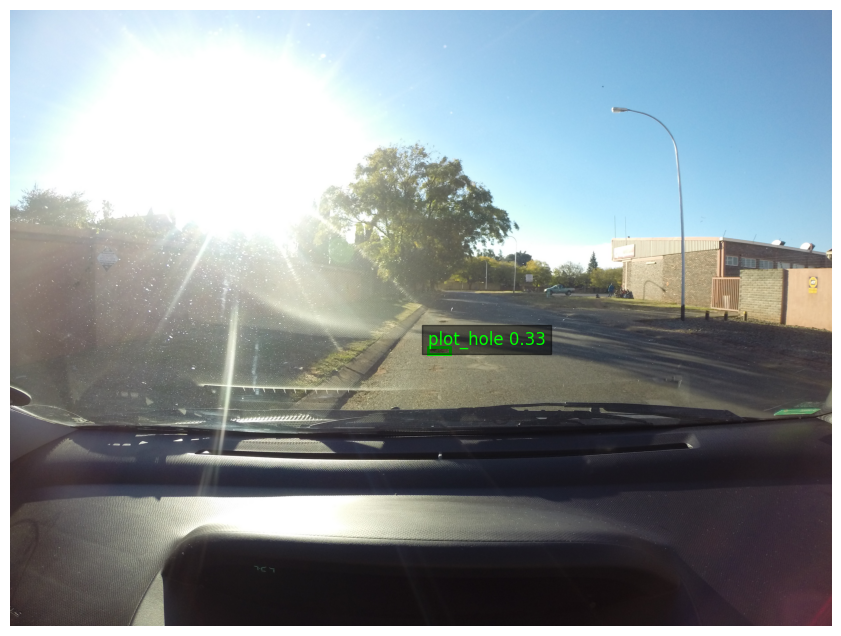


image 1/1 /kaggle/working/yolo_data/images/test/G0010760.JPG: 480x640 1 plot_hole, 7.1ms
Speed: 3.0ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


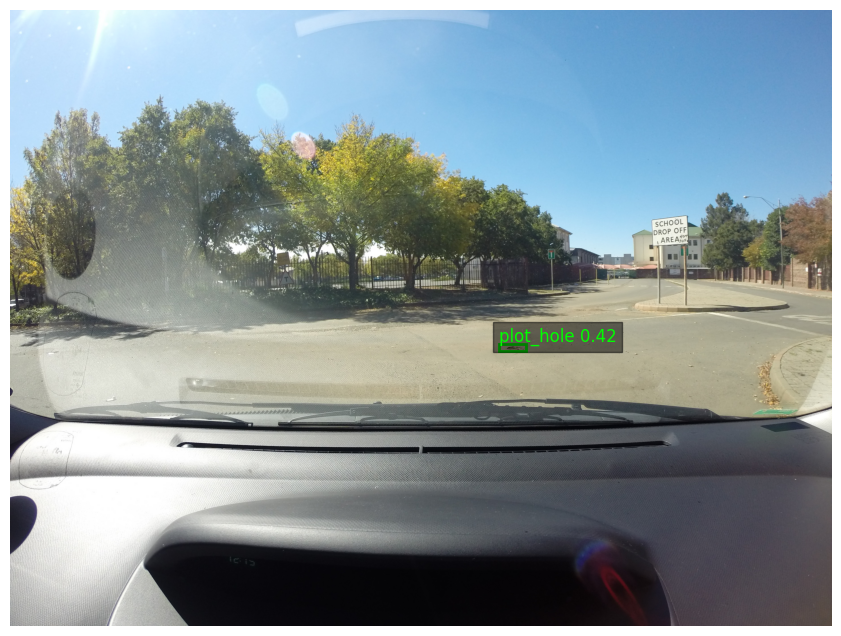


image 1/1 /kaggle/working/yolo_data/images/test/G0010770.JPG: 480x640 2 plot_holes, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


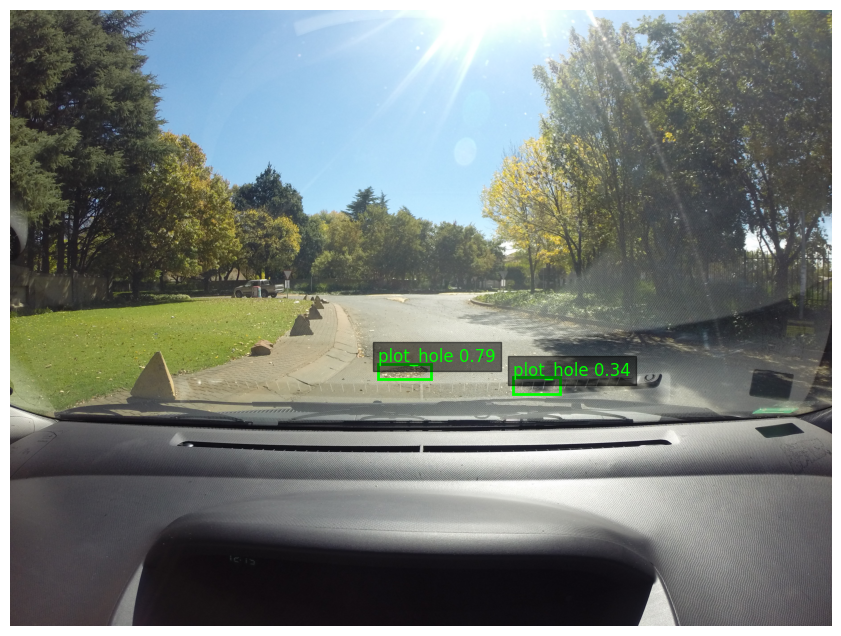

In [14]:
import cv2  # Add this import at the top
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from ultralytics import YOLO
import os

def plot_predictions(img_path, model, conf_thresh=0.3):
    """Visualize predictions with bounding boxes"""
    # Read image
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    
    # Predict
    results = model.predict(img_path, conf=conf_thresh)
    
    # Create plot
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)
    
    # Draw predictions
    for box in results[0].boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = box.conf.item()
        cls_id = int(box.cls)
        
        # Create rectangle
        rect = patches.Rectangle(
            (x1, y1), x2-x1, y2-y1,
            linewidth=2, edgecolor='lime', facecolor='none')
        ax.add_patch(rect)
        
        # Add label
        label = f"{results[0].names[cls_id]} {conf:.2f}"
        ax.text(x1, y1-10, label, color='lime', fontsize=12, 
                bbox=dict(facecolor='black', alpha=0.5))
    
    plt.axis('off')
    plt.show()

# Initialize model
model = YOLO('/kaggle/working/runs/detect/yolo_train/weights/best.pt')
test_dir = '/kaggle/working/yolo_data/images/test'

# Visualize first 3 test images
for img_name in sorted(os.listdir(test_dir))[:3]:
    if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
        plot_predictions(os.path.join(test_dir, img_name), model)

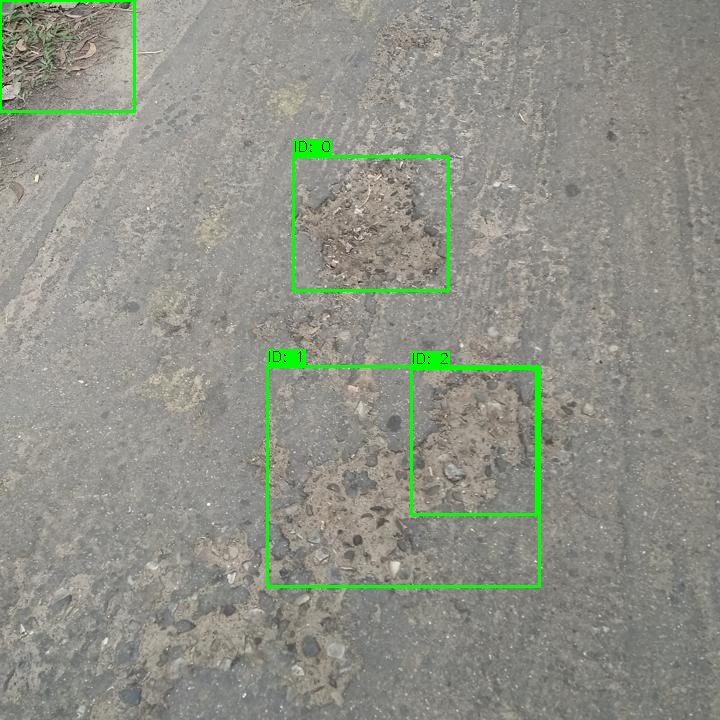

Predictions for img-208_jpg.rf.137d967b7b8672f47e86429a98b89252:
                                        unique_id   xmin   ymin   xmax   ymax
img-208_jpg.rf.137d967b7b8672f47e86429a98b89252_0 293.63 156.14 448.54 290.92
img-208_jpg.rf.137d967b7b8672f47e86429a98b89252_1 267.96 366.38 539.64 586.70
img-208_jpg.rf.137d967b7b8672f47e86429a98b89252_2 411.95 368.67 536.88 514.11
img-208_jpg.rf.137d967b7b8672f47e86429a98b89252_3   0.00   0.00 134.57 111.33




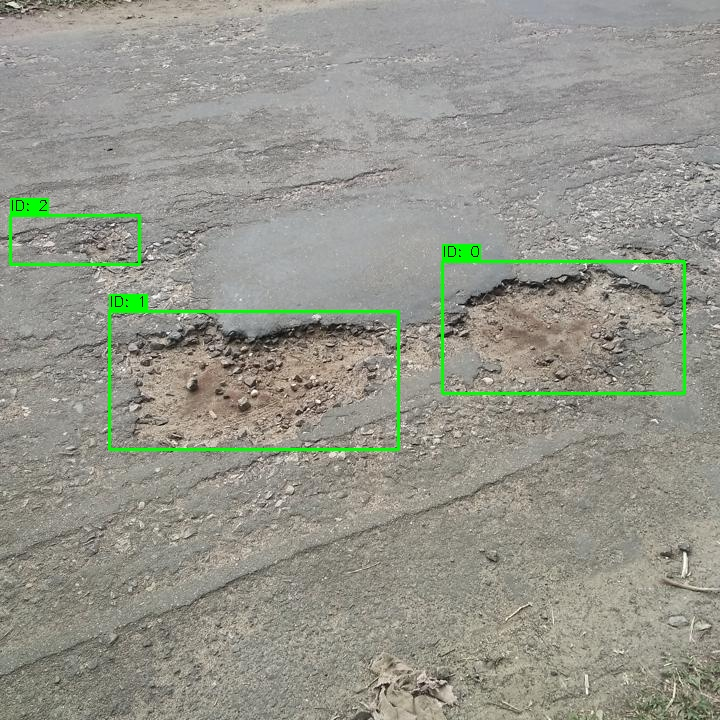

Predictions for img-186_jpg.rf.c354a07266904a6e8212056359600aec:
                                        unique_id   xmin   ymin   xmax   ymax
img-186_jpg.rf.c354a07266904a6e8212056359600aec_0 442.83 261.05 684.08 393.61
img-186_jpg.rf.c354a07266904a6e8212056359600aec_1 109.88 311.78 398.91 449.47
img-186_jpg.rf.c354a07266904a6e8212056359600aec_2  10.84 215.04 139.52 264.59




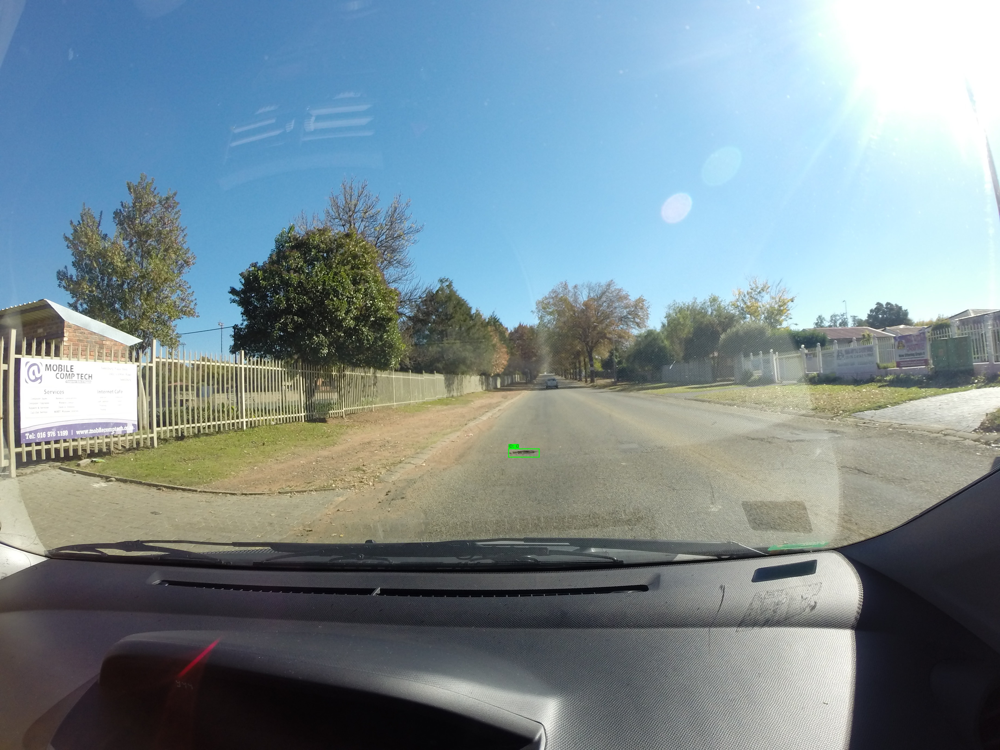

Predictions for G0027591:
 unique_id    xmin    ymin    xmax    ymax
G0027591_0 1871.26 1651.33 1984.26 1682.41




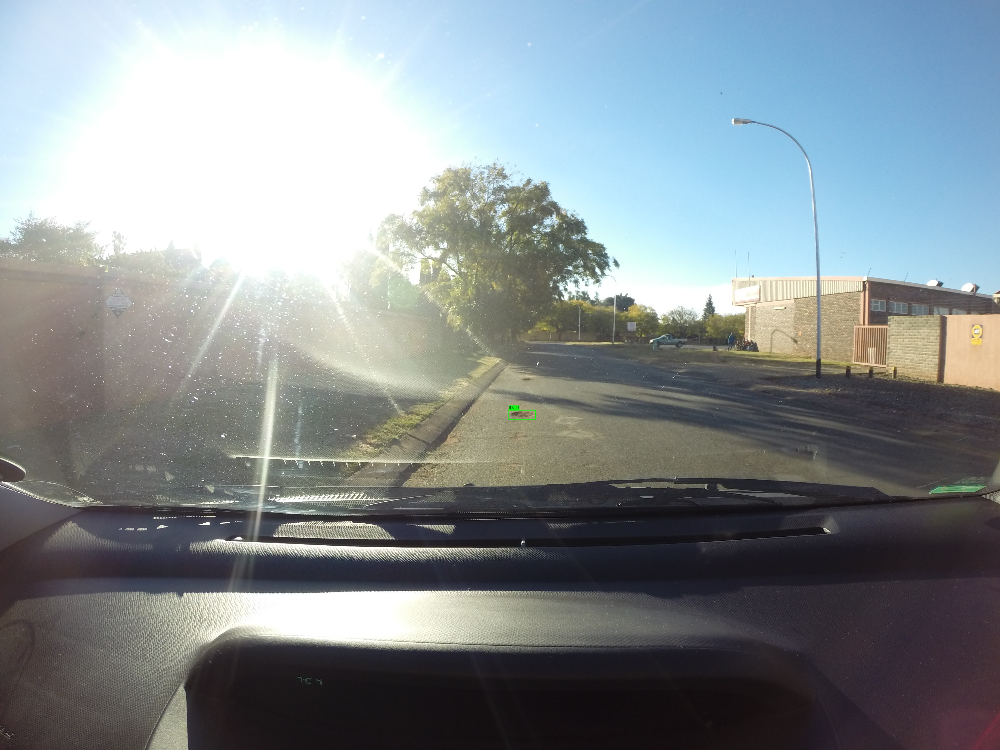

Predictions for G0010124:
 unique_id    xmin    ymin    xmax    ymax
G0010124_0 1872.41 1509.92 1970.29 1543.32




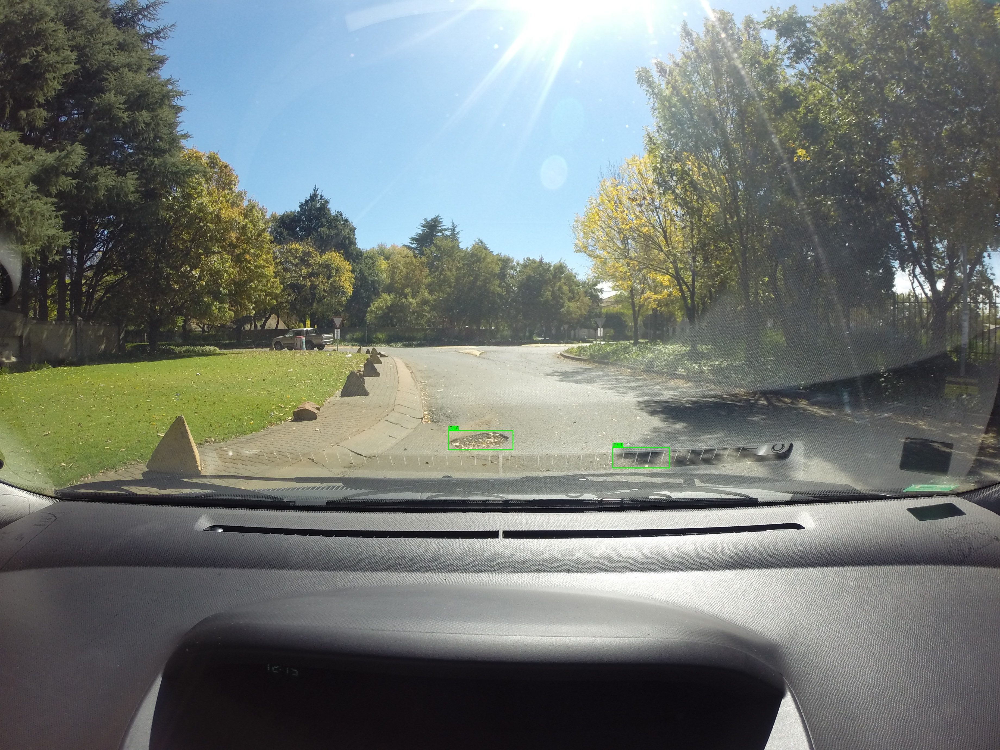

Predictions for G0010770:
 unique_id    xmin    ymin    xmax    ymax
G0010770_0 1650.84 1584.47 1887.92 1654.71
G0010770_1 2254.13 1646.34 2463.73 1721.89




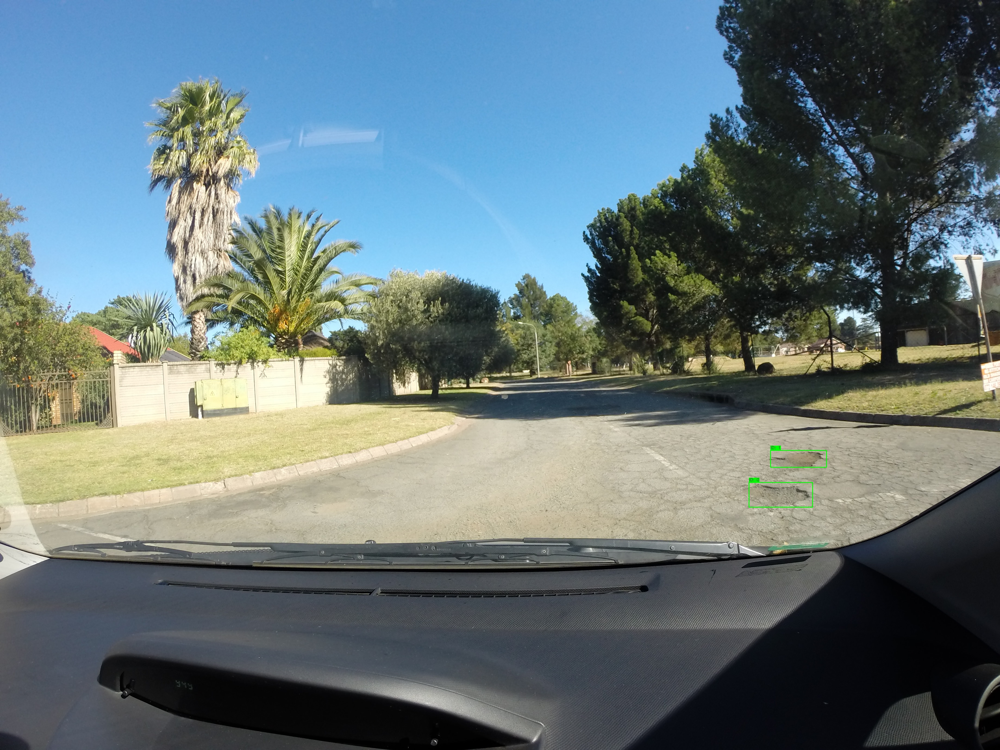

Predictions for G0028159:
 unique_id    xmin    ymin    xmax    ymax
G0028159_0 2756.91 1775.32 2990.40 1866.74
G0028159_1 2835.51 1657.77 3041.29 1719.22




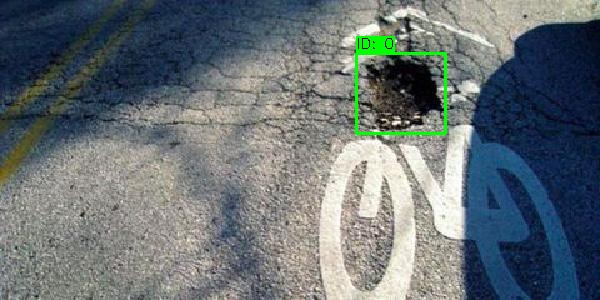

Predictions for img-371_jpg.rf.a893e0bdc6fda0ba1b2a7f07d56cec23:
                                        unique_id   xmin  ymin  xmax   ymax
img-371_jpg.rf.a893e0bdc6fda0ba1b2a7f07d56cec23_0 356.28 53.21 445.1 133.78




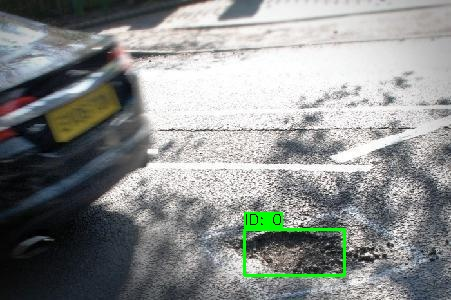

Predictions for img-430_jpg.rf.f23ac782ee062c81370384e3ea211b5d:
                                        unique_id   xmin   ymin  xmax   ymax
img-430_jpg.rf.f23ac782ee062c81370384e3ea211b5d_0 244.23 229.43 344.6 275.72




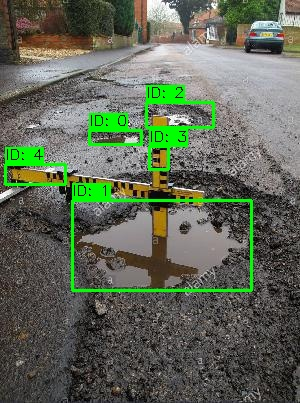

Predictions for img-336_jpg.rf.eeafb6921ceff278aa8e24afe9f78f8a:
                                        unique_id   xmin   ymin   xmax   ymax
img-336_jpg.rf.eeafb6921ceff278aa8e24afe9f78f8a_0  89.89 130.90 141.96 144.77
img-336_jpg.rf.eeafb6921ceff278aa8e24afe9f78f8a_1  72.14 200.29 251.77 290.78
img-336_jpg.rf.eeafb6921ceff278aa8e24afe9f78f8a_2 146.83 102.73 213.09 127.22
img-336_jpg.rf.eeafb6921ceff278aa8e24afe9f78f8a_3 149.08 146.70 168.62 169.33
img-336_jpg.rf.eeafb6921ceff278aa8e24afe9f78f8a_4   5.26 164.36  65.54 184.44




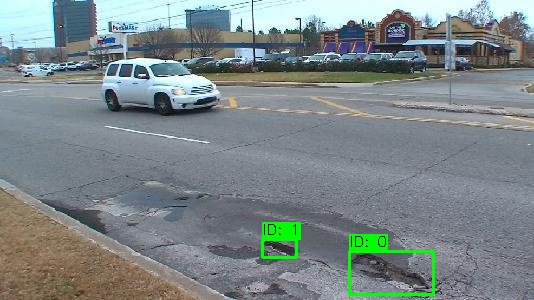

Predictions for img-294_jpg.rf.a16953e9091e3eecfc338ed3044ef294:
                                        unique_id   xmin   ymin   xmax   ymax
img-294_jpg.rf.a16953e9091e3eecfc338ed3044ef294_0 349.56 251.12 433.16 294.56
img-294_jpg.rf.a16953e9091e3eecfc338ed3044ef294_1 262.39 239.38 296.89 257.80


  adding: kaggle/working/visualized_predictions/ (stored 0%)
  adding: kaggle/working/visualized_predictions/pred_G0020206.jpg (deflated 1%)
  adding: kaggle/working/visualized_predictions/pred_img-452_jpg.rf.005f706e703f7518562fc3ec4df0543f.jpg (deflated 7%)
  adding: kaggle/working/visualized_predictions/pred_img-434_jpg.rf.9e48a92f792098919bba712a29b05065.jpg (deflated 7%)
  adding: kaggle/working/visualized_predictions/pred_G0026518.jpg (deflated 1%)
  adding: kaggle/working/visualized_predictions/pred_G0011621.jpg (deflated 2%)
  adding: kaggle/working/visualized_predictions/pred_G0011766.jpg (deflated 3%)
  adding: kaggle/working/visualized_predictions/pred_G0027049.jpg (deflated 3%)


NameError: name 'FileLink' is not defined

In [15]:
import cv2
import pandas as pd
import os
import matplotlib.pyplot as plt
from IPython.display import display, Image

# Load submission data
submission_df = pd.read_csv('submission.csv')

# Configuration
TEST_IMAGES_DIR = '/kaggle/working/yolo_data/images/test'  # Update this path
OUTPUT_DIR = '/kaggle/working/visualized_predictions'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Color settings
BOX_COLOR = (0, 255, 0)  # Green
TEXT_COLOR = (0, 0, 0)    # Black
TEXT_BG_COLOR = (0, 255, 0)  # Green

def visualize_predictions(image_id, predictions):
    """Draw predictions on a single image"""
    # Find the image file (handling different extensions)
    img_path = None
    for ext in ['.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG']:
        possible_path = os.path.join(TEST_IMAGES_DIR, f"{image_id}{ext}")
        if os.path.exists(possible_path):
            img_path = possible_path
            break
    
    if not img_path:
        print(f"Image not found: {image_id}")
        return None
    
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        print(f"Failed to load image: {img_path}")
        return None
    
    # Convert color for matplotlib
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_h, img_w = img.shape[:2]
    
    # Draw each prediction
    for _, pred in predictions.iterrows():
        xmin, ymin, xmax, ymax = map(int, [pred['xmin'], pred['ymin'], pred['xmax'], pred['ymax']])
        
        # Draw rectangle
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), BOX_COLOR, 2)
        
        # Draw label background
        label = f"ID: {pred['unique_id'].split('_')[-1]}"
        (text_w, text_h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        cv2.rectangle(img, (xmin, ymin - text_h - 5), (xmin + text_w, ymin), TEXT_BG_COLOR, -1)
        
        # Draw text
        cv2.putText(img, label, (xmin, ymin - 5), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, TEXT_COLOR, 1)
    
    # Save and return
    output_path = os.path.join(OUTPUT_DIR, f"pred_{image_id}.jpg")
    cv2.imwrite(output_path, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    return output_path

# Process all unique images
for image_id in submission_df['image_id'].unique():
    img_predictions = submission_df[submission_df['image_id'] == image_id]
    output_path = visualize_predictions(image_id, img_predictions)
    
    if output_path:
        # Display first few images
        if len(os.listdir(OUTPUT_DIR)) <= 10:  # Only show first 10
            display(Image(filename=output_path, width=600))
            print(f"Predictions for {image_id}:")
            print(img_predictions[['unique_id', 'xmin', 'ymin', 'xmax', 'ymax']].to_string(index=False))
            print("\n" + "="*80 + "\n")

# Create zip for download
!zip -r /kaggle/working/prediction_visualizations.zip {OUTPUT_DIR}
print("\nAll visualizations saved to:", OUTPUT_DIR)
display(FileLink('/kaggle/working/prediction_visualizations.zip'))

In [16]:
import cv2
import pandas as pd
import os
import matplotlib.pyplot as plt
from IPython.display import display, Image, FileLink  # Added FileLink import

# Load submission data
submission_df = pd.read_csv('submission.csv')

# Configuration
TEST_IMAGES_DIR = '/kaggle/working/yolo_data/images/test'  # Update this path
OUTPUT_DIR = '/kaggle/working/visualized_predictions'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Color settings
BOX_COLOR = (0, 255, 0)  # Green
TEXT_COLOR = (0, 0, 0)    # Black
TEXT_BG_COLOR = (0, 255, 0)  # Green

def visualize_predictions(image_id, predictions):
    """Draw predictions on a single image"""
    # Find the image file (handling different extensions)
    img_path = None
    for ext in ['.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG']:
        possible_path = os.path.join(TEST_IMAGES_DIR, f"{image_id}{ext}")
        if os.path.exists(possible_path):
            img_path = possible_path
            break
    
    if not img_path:
        print(f"Image not found: {image_id}")
        return None
    
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        print(f"Failed to load image: {img_path}")
        return None
    
    # Convert color for matplotlib
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_h, img_w = img.shape[:2]
    
    # Draw each prediction
    for _, pred in predictions.iterrows():
        xmin, ymin, xmax, ymax = map(int, [pred['xmin'], pred['ymin'], pred['xmax'], pred['ymax']])
        
        # Draw rectangle
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), BOX_COLOR, 2)
        
        # Draw label background
        label = f"ID: {pred['unique_id'].split('_')[-1]}"
        (text_w, text_h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        cv2.rectangle(img, (xmin, ymin - text_h - 5), (xmin + text_w, ymin), TEXT_BG_COLOR, -1)
        
        # Draw text
        cv2.putText(img, label, (xmin, ymin - 5), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, TEXT_COLOR, 1)
    
    # Save and return
    output_path = os.path.join(OUTPUT_DIR, f"pred_{image_id}.jpg")
    cv2.imwrite(output_path, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    return output_path

# Process all unique images
for image_id in submission_df['image_id'].unique():
    img_predictions = submission_df[submission_df['image_id'] == image_id]
    output_path = visualize_predictions(image_id, img_predictions)
    
    if output_path:
        # Display first few images
        if len(os.listdir(OUTPUT_DIR)) <= 10:  # Only show first 10
            display(Image(filename=output_path, width=600))
            print(f"Predictions for {image_id}:")
            print(img_predictions[['unique_id', 'xmin', 'ymin', 'xmax', 'ymax']].to_string(index=False))
            print("\n" + "="*80 + "\n")

# Create zip for download
!zip -r /kaggle/working/prediction_visualizations.zip {OUTPUT_DIR}
print("\nAll visualizations saved to:", OUTPUT_DIR)
display(FileLink('/kaggle/working/prediction_visualizations.zip'))

updating: kaggle/working/visualized_predictions/ (stored 0%)
updating: kaggle/working/visualized_predictions/pred_G0020206.jpg (deflated 1%)
updating: kaggle/working/visualized_predictions/pred_img-452_jpg.rf.005f706e703f7518562fc3ec4df0543f.jpg (deflated 7%)
updating: kaggle/working/visualized_predictions/pred_img-434_jpg.rf.9e48a92f792098919bba712a29b05065.jpg (deflated 7%)
updating: kaggle/working/visualized_predictions/pred_G0026518.jpg (deflated 1%)
updating: kaggle/working/visualized_predictions/pred_G0011621.jpg (deflated 2%)
updating: kaggle/working/visualized_predictions/pred_G0011766.jpg (deflated 3%)
updating: kaggle/working/visualized_predictions/pred_G0027049.jpg (deflated 3%)
updating: kaggle/working/visualized_predictions/pred_img-440_jpg.rf.4475e2f277c4b84b9d5ae3095916bffa.jpg (deflated 7%)
updating: kaggle/working/visualized_predictions/pred_img-477_jpg.rf.ac13626d46335c39852c19d1770abd10.jpg (deflated 7%)
updating: kaggle/working/visualized_predictions/pred_G0022108.j

/kaggle/working/prediction_visualizations.zip

In [17]:
import os
from IPython.display import FileLink

# 1. Create ZIP of the folder
!zip -r /kaggle/working/visualized_predictions.zip /kaggle/working/visualized_predictions

# 2. Generate download link
print("👇 Click below to download ALL visualizations as a ZIP:")
display(FileLink('/kaggle/working/visualized_predictions.zip'))

  adding: kaggle/working/visualized_predictions/ (stored 0%)
  adding: kaggle/working/visualized_predictions/pred_G0020206.jpg (deflated 1%)
  adding: kaggle/working/visualized_predictions/pred_img-452_jpg.rf.005f706e703f7518562fc3ec4df0543f.jpg (deflated 7%)
  adding: kaggle/working/visualized_predictions/pred_img-434_jpg.rf.9e48a92f792098919bba712a29b05065.jpg (deflated 7%)
  adding: kaggle/working/visualized_predictions/pred_G0026518.jpg (deflated 1%)
  adding: kaggle/working/visualized_predictions/pred_G0011621.jpg (deflated 2%)
  adding: kaggle/working/visualized_predictions/pred_G0011766.jpg (deflated 3%)
  adding: kaggle/working/visualized_predictions/pred_G0027049.jpg (deflated 3%)
  adding: kaggle/working/visualized_predictions/pred_img-440_jpg.rf.4475e2f277c4b84b9d5ae3095916bffa.jpg (deflated 7%)
  adding: kaggle/working/visualized_predictions/pred_img-477_jpg.rf.ac13626d46335c39852c19d1770abd10.jpg (deflated 7%)
  adding: kaggle/working/visualized_predictions/pred_G0022108.j

/kaggle/working/visualized_predictions.zip

In [ ]:
import cv2
import pandas as pd
import os
import numpy as np
from ultralytics import YOLO

# Configuration
MODEL_PATH = '/kaggle/working/runs/detect/yolo_train/weights/best.pt'
TEST_IMAGES_DIR = '/kaggle/working/yolo_data/images/test'
IMAGE_WIDTH, IMAGE_HEIGHT = 640, 640  # Update these to your image dimensions
CONF_THRESHOLD = 0.3

# Initialize model
model = YOLO(MODEL_PATH)

# Predict and process
results = []
for img_name in os.listdir(TEST_IMAGES_DIR):
    if not img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue
        
    # Predict
    img_path = os.path.join(TEST_IMAGES_DIR, img_name)
    img = cv2.imread(img_path)
    h, w = img.shape[:2]  # Get actual image dimensions
    
    preds = model.predict(img_path, conf=CONF_THRESHOLD)
    
    # Process boxes
    for i, box in enumerate(preds[0].boxes.xyxy.cpu().numpy()):
        image_id = os.path.splitext(img_name)[0].split('.rf')[0]
        xmin, ymin, xmax, ymax = box
        
        # Clip coordinates to image boundaries
        xmin = max(0, min(xmin, w-1))
        ymin = max(0, min(ymin, h-1))
        xmax = max(0, min(xmax, w-1))
        ymax = max(0, min(ymax, h-1))
        
        # Normalize and round
        results.append({
            'unique_id': f'{image_id}_{i}',
            'image_id': image_id,
            'xmin': round(xmin/w, 6),
            'ymin': round(ymin/h, 6),
            'xmax': round(xmax/w, 6),
            'ymax': round(ymax/h, 6)
        })

# Create DataFrame
submission = pd.DataFrame(results)

# Final clipping safeguard (shouldn't be needed but just in case)
submission[['xmin','ymin','xmax','ymax']] = submission[['xmin','ymin','xmax','ymax']].clip(0, 1)

# Save submission
submission.to_csv('/kaggle/working/submission_final.csv', index=False, float_format='%.6f')

print("✅ Submission file created with proper normalization!")
print(f"📊 Coordinate ranges:")
print(submission[['xmin','ymin','xmax','ymax']].agg(['min','max']))


image 1/1 /kaggle/working/yolo_data/images/test/img-208_jpg.rf.137d967b7b8672f47e86429a98b89252.jpg: 640x640 4 plot_holes, 7.4ms
Speed: 2.7ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/yolo_data/images/test/img-186_jpg.rf.c354a07266904a6e8212056359600aec.jpg: 640x640 3 plot_holes, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0027591.JPG: 480x640 1 plot_hole, 6.9ms
Speed: 2.6ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0010124.JPG: 480x640 1 plot_hole, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0010770.JPG: 480x640 2 plot_holes, 6.1ms
Speed: 2.6ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3,

In [25]:
# 1. First create the missing validation image
!mkdir -p /usr/local/lib/python3.11/dist-packages/ultralytics/assets
!wget https://ultralytics.com/images/bus.jpg -O /usr/local/lib/python3.11/dist-packages/ultralytics/assets/bus.jpg

# 2. Now run normal training
from ultralytics import YOLO

model = YOLO('yolov8n.pt')
model.train(
    data='/kaggle/working/yolo_data/data.yaml',
    epochs=50,
    imgsz=640,
    batch=16,
    name='yolo_train',
    exist_ok=True  # Overwrites existing runs
)

# 3. Verify training completed
!ls /kaggle/working/runs/detect/yolo_train/weights/best.pt

--2025-04-26 22:06:17--  https://ultralytics.com/images/bus.jpg
Resolving ultralytics.com (ultralytics.com)... 75.2.70.75, 99.83.190.102
Connecting to ultralytics.com (ultralytics.com)|75.2.70.75|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.ultralytics.com/images/bus.jpg [following]
--2025-04-26 22:06:17--  https://www.ultralytics.com/images/bus.jpg
Resolving www.ultralytics.com (www.ultralytics.com)... 104.18.40.102, 172.64.147.154, 2606:4700:4400::ac40:939a, ...
Connecting to www.ultralytics.com (www.ultralytics.com)|104.18.40.102|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/ultralytics/assets/releases/download/v0.0.0/bus.jpg [following]
--2025-04-26 22:06:18--  https://github.com/ultralytics/assets/releases/download/v0.0.0/bus.jpg
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request 

train: Scanning /kaggle/working/yolo_data/labels/train.cache... 497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 497/497 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 516.5±175.5 MB/s, size: 1298.9 KB)


val: Scanning /kaggle/working/yolo_data/labels/valid.cache... 93 images, 0 backgrounds, 0 corrupt: 100%|██████████| 93/93 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolo_train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolo_train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.33G      1.885      3.352      1.565          9        640: 100%|██████████| 32/32 [00:13<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.83it/s]

                   all         93        239    0.00642      0.347     0.0735     0.0356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50       2.6G      1.782      2.645      1.478          3        640: 100%|██████████| 32/32 [00:13<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]

                   all         93        239       0.61     0.0589      0.126     0.0566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50       2.6G      1.787      2.287      1.428          1        640: 100%|██████████| 32/32 [00:15<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.11it/s]

                   all         93        239      0.285     0.0879     0.0691     0.0239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       2.6G      1.791       2.17      1.424          3        640: 100%|██████████| 32/32 [00:13<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.14it/s]

                   all         93        239      0.285      0.195      0.166     0.0669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50       2.6G      1.841      2.122      1.458          1        640: 100%|██████████| 32/32 [00:14<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.96it/s]

                   all         93        239      0.301      0.418       0.25     0.0982



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       2.6G      1.759      1.961      1.454          7        640: 100%|██████████| 32/32 [00:14<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.42it/s]

                   all         93        239      0.343      0.417      0.274      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       2.6G      1.714      1.906      1.421          7        640: 100%|██████████| 32/32 [00:14<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.29it/s]

                   all         93        239      0.443      0.456       0.36       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       2.6G      1.631      1.766      1.415          1        640: 100%|██████████| 32/32 [00:14<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         93        239      0.584      0.389      0.412      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50       2.6G      1.636      1.638      1.366          2        640: 100%|██████████| 32/32 [00:15<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.29it/s]

                   all         93        239      0.573      0.505      0.488       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50       2.6G      1.641      1.725      1.333          7        640: 100%|██████████| 32/32 [00:14<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.06it/s]

                   all         93        239      0.543      0.527      0.463      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50       2.6G       1.66      1.565      1.387          3        640: 100%|██████████| 32/32 [00:14<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.86it/s]

                   all         93        239       0.63      0.523      0.526      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50       2.6G      1.638      1.525       1.35          4        640: 100%|██████████| 32/32 [00:14<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.58it/s]

                   all         93        239      0.611      0.481      0.513      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50       2.6G      1.578      1.491      1.295          4        640: 100%|██████████| 32/32 [00:14<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         93        239      0.564      0.494      0.477      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50       2.6G      1.611      1.535      1.301          1        640: 100%|██████████| 32/32 [00:13<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.87it/s]

                   all         93        239      0.554      0.463      0.487      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       2.6G      1.576      1.492      1.309          1        640: 100%|██████████| 32/32 [00:14<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.45it/s]

                   all         93        239      0.652      0.534      0.578      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       2.6G      1.554      1.369      1.309          2        640: 100%|██████████| 32/32 [00:14<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.93it/s]

                   all         93        239      0.653      0.519      0.528      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       2.6G      1.503      1.337       1.27         17        640: 100%|██████████| 32/32 [00:14<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.55it/s]

                   all         93        239      0.587      0.541      0.556      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       2.6G      1.415      1.288      1.226          4        640: 100%|██████████| 32/32 [00:14<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.27it/s]

                   all         93        239      0.667      0.515      0.571      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50       2.6G      1.492      1.266      1.263          4        640: 100%|██████████| 32/32 [00:13<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.17it/s]

                   all         93        239      0.608      0.527       0.51      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50       2.6G      1.452      1.228      1.254          6        640: 100%|██████████| 32/32 [00:14<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.54it/s]

                   all         93        239      0.665      0.519       0.57      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50       2.6G      1.439      1.198      1.248          5        640: 100%|██████████| 32/32 [00:13<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.85it/s]

                   all         93        239      0.688      0.565      0.575      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50       2.6G      1.383      1.331      1.199          0        640: 100%|██████████| 32/32 [00:13<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.39it/s]

                   all         93        239      0.685      0.574      0.608      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50       2.6G      1.429      1.234      1.233          5        640: 100%|██████████| 32/32 [00:14<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.33it/s]

                   all         93        239      0.681      0.607      0.613      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       2.6G      1.397       1.21      1.224          1        640: 100%|██████████| 32/32 [00:13<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.99it/s]

                   all         93        239      0.666      0.548      0.573      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50       2.6G      1.358      1.137      1.185          5        640: 100%|██████████| 32/32 [00:14<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.76it/s]

                   all         93        239       0.69       0.54      0.591      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       2.6G      1.374      1.141      1.213          9        640: 100%|██████████| 32/32 [00:13<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.33it/s]

                   all         93        239      0.705      0.539      0.559      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50       2.6G      1.348      1.134      1.204          2        640: 100%|██████████| 32/32 [00:14<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.15it/s]

                   all         93        239       0.66       0.54      0.551      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       2.6G      1.373      1.116      1.204          3        640: 100%|██████████| 32/32 [00:13<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.37it/s]

                   all         93        239       0.71      0.562      0.632      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50       2.6G      1.374      1.131      1.219          2        640: 100%|██████████| 32/32 [00:14<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.87it/s]

                   all         93        239      0.679      0.561      0.602      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50       2.6G      1.314      1.065      1.183         14        640: 100%|██████████| 32/32 [00:13<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.88it/s]

                   all         93        239      0.743      0.586      0.657      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50       2.6G      1.311      1.033       1.18          1        640: 100%|██████████| 32/32 [00:14<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]

                   all         93        239      0.701      0.619      0.645      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50       2.6G      1.304      1.023      1.206          1        640: 100%|██████████| 32/32 [00:14<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.47it/s]

                   all         93        239       0.78      0.573      0.646      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       2.6G        1.3      1.013      1.159          2        640: 100%|██████████| 32/32 [00:13<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.61it/s]

                   all         93        239      0.722      0.599      0.621      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       2.6G      1.323      1.001      1.164          9        640: 100%|██████████| 32/32 [00:14<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.27it/s]

                   all         93        239      0.737      0.563       0.63      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       2.6G      1.221      1.072      1.106          0        640: 100%|██████████| 32/32 [00:13<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.11it/s]

                   all         93        239      0.708      0.598      0.623      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       2.6G      1.346      1.043      1.166          9        640: 100%|██████████| 32/32 [00:14<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.11it/s]

                   all         93        239      0.726      0.588      0.649      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       2.6G      1.251     0.9649      1.134          4        640: 100%|██████████| 32/32 [00:13<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.92it/s]

                   all         93        239      0.779       0.62      0.665      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50       2.6G      1.216     0.9832      1.099          0        640: 100%|██████████| 32/32 [00:14<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.96it/s]

                   all         93        239      0.755      0.619      0.667      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50       2.6G      1.249     0.9152      1.148         10        640: 100%|██████████| 32/32 [00:13<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.18it/s]

                   all         93        239      0.701      0.577      0.618      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50       2.6G      1.252     0.9132      1.142          3        640: 100%|██████████| 32/32 [00:14<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.96it/s]

                   all         93        239      0.759      0.611      0.666      0.336


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       2.6G      1.223     0.9445      1.078          2        640: 100%|██████████| 32/32 [00:12<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.02it/s]

                   all         93        239      0.752       0.57      0.638       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       2.6G      1.156     0.8669      1.081          1        640: 100%|██████████| 32/32 [00:11<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.65it/s]

                   all         93        239       0.76      0.607      0.662      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       2.6G      1.116     0.8461      1.081          2        640: 100%|██████████| 32/32 [00:10<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.17it/s]

                   all         93        239      0.791      0.636      0.683      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       2.6G      1.127     0.8226      1.089          1        640: 100%|██████████| 32/32 [00:10<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.23it/s]

                   all         93        239      0.798      0.586      0.667      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50       2.6G      1.139     0.8069      1.053          5        640: 100%|██████████| 32/32 [00:10<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.46it/s]

                   all         93        239      0.813      0.619      0.684      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       2.6G      1.125     0.7974      1.049          2        640: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.41it/s]

                   all         93        239       0.83      0.612       0.69       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50       2.6G      1.134     0.8046      1.041          2        640: 100%|██████████| 32/32 [00:10<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.83it/s]


                   all         93        239      0.742      0.636      0.669      0.349

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       2.6G      1.118     0.8022      1.034          1        640: 100%|██████████| 32/32 [00:11<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.63it/s]

                   all         93        239      0.733      0.619      0.675       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       2.6G      1.092     0.7781      1.022          2        640: 100%|██████████| 32/32 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.16it/s]

                   all         93        239       0.79      0.582      0.672      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50       2.6G      1.053     0.7254      1.019          1        640: 100%|██████████| 32/32 [00:10<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.29it/s]

                   all         93        239      0.765      0.644      0.683      0.358



50 epochs completed in 0.207 hours.
Optimizer stripped from runs/detect/yolo_train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/yolo_train/weights/best.pt, 6.3MB

Validating runs/detect/yolo_train/weights/best.pt...
Ultralytics 8.3.117 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]


                   all         93        239      0.765      0.644      0.683      0.358
             plot_hole         93        239      0.765      0.644      0.683      0.358


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/yolo_train
/kaggle/working/runs/detect/yolo_train/weights/best.pt


In [29]:
from ultralytics import YOLO
import pandas as pd
import os

# Load your trained model
model = YOLO('/kaggle/working/runs/detect/yolo_train/weights/best.pt')

# Run test inference
test_results = model.predict(
    source='/kaggle/working/yolo_data/images/test',
    conf=0.3,  # Adjust confidence threshold as needed
    iou=0.45,   # NMS IoU threshold
    save=False,  # Disable saving images to speed up
    stream=True, # More memory efficient
    verbose=True # Show progress
)

# Generate submission.csv
submission_data = []
for result in test_results:
    image_id = os.path.splitext(os.path.basename(result.path))[0].split('.rf')[0]
    
    for i, box in enumerate(result.boxes):
        submission_data.append({
            'unique_id': f"{image_id}_{i}",
            'image_id': image_id,
            'xmin': round(box.xyxy[0][0].item(), 1),
            'ymin': round(box.xyxy[0][1].item(), 1),
            'xmax': round(box.xyxy[0][2].item(), 1),
            'ymax': round(box.xyxy[0][3].item(), 1),
            'confidence': round(box.conf.item(), 4)  # Optional
        })

# Create DataFrame
submission_df = pd.DataFrame(submission_data)

# Save (with or without confidence)
submission_df[['unique_id','image_id','xmin','ymin','xmax','ymax']].to_csv(
    'submission.csv', 
    index=False,
    float_format='%.1f'  # Rounds coordinates to 1 decimal
)

print(f"\n✅ Generated {len(submission_df)} predictions")
print("Sample submission:")
print(submission_df.head(3))


image 1/64 /kaggle/working/yolo_data/images/test/G0010124.JPG: 480x640 1 plot_hole, 6.8ms
image 2/64 /kaggle/working/yolo_data/images/test/G0010760.JPG: 480x640 1 plot_hole, 6.1ms
image 3/64 /kaggle/working/yolo_data/images/test/G0010770.JPG: 480x640 2 plot_holes, 6.1ms
image 4/64 /kaggle/working/yolo_data/images/test/G0011427.JPG: 480x640 (no detections), 6.2ms
image 5/64 /kaggle/working/yolo_data/images/test/G0011621.JPG: 480x640 (no detections), 6.1ms
image 6/64 /kaggle/working/yolo_data/images/test/G0011764.JPG: 480x640 1 plot_hole, 6.3ms
image 7/64 /kaggle/working/yolo_data/images/test/G0011766.JPG: 480x640 (no detections), 6.1ms
image 8/64 /kaggle/working/yolo_data/images/test/G0020197.JPG: 480x640 1 plot_hole, 6.2ms
image 9/64 /kaggle/working/yolo_data/images/test/G0020206.JPG: 480x640 (no detections), 6.2ms
image 10/64 /kaggle/working/yolo_data/images/test/G0022106.JPG: 480x640 1 plot_hole, 6.2ms
image 11/64 /kaggle/working/yolo_data/images/test/G0022107.JPG: 480x640 2 plot_ho

In [31]:
from ultralytics import YOLO
import pandas as pd
import os

# Load trained model
model = YOLO('/kaggle/working/runs/detect/yolo_train/weights/best.pt')

# Run test inference with normalization
submission_data = []
for img_name in os.listdir('/kaggle/working/yolo_data/images/test'):
    if not img_name.lower().endswith(('.jpg', '.png', '.jpeg')):
        continue
    
    img_path = os.path.join('/kaggle/working/yolo_data/images/test', img_name)
    
    # Get image dimensions for normalization
    img = cv2.imread(img_path)
    img_height, img_width = img.shape[:2]
    
    # Predict
    results = model.predict(img_path, conf=0.3)
    
    # Process boxes with normalization
    for i, box in enumerate(results[0].boxes.xyxyn.cpu().numpy()):  # xyxy already normalized
        submission_data.append({
            'unique_id': f"{os.path.splitext(img_name)[0]}_{i}",
            'image_id': os.path.splitext(img_name)[0],
            'xmin': round(box[0], 6),  # xmin normalized (0-1)
            'ymin': round(box[1], 6),  # ymin normalized (0-1)
            'xmax': round(box[2], 6),  # xmax normalized (0-1)
            'ymax': round(box[3], 6)   # ymax normalized (0-1)
        })

# Create and save submission
submission_df = pd.DataFrame(submission_data)
submission_df.to_csv('submission_normalized.csv', index=False, float_format='%.6f')

print(f"✅ Saved {len(submission_df)} normalized predictions")
print("Sample normalized coordinates:")
print(submission_df.head(3))


image 1/1 /kaggle/working/yolo_data/images/test/img-208_jpg.rf.137d967b7b8672f47e86429a98b89252.jpg: 640x640 3 plot_holes, 8.1ms
Speed: 3.0ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/yolo_data/images/test/img-186_jpg.rf.c354a07266904a6e8212056359600aec.jpg: 640x640 3 plot_holes, 7.4ms
Speed: 2.4ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0027591.JPG: 480x640 (no detections), 6.9ms
Speed: 2.7ms preprocess, 6.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0010124.JPG: 480x640 1 plot_hole, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0010770.JPG: 480x640 2 plot_holes, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1

In [36]:
import cv2
import pandas as pd
import os
from ultralytics import YOLO

# 1. Load your trained model
model = YOLO('/kaggle/working/runs/detect/yolo_train/weights/best.pt')

# 2. Configuration
TEST_DIR = '/kaggle/working/yolo_data/images/test'
CONF_THRESH = 0.3  # Optimized for your 68.3 mAP
IMAGE_SIZE = 640    # Should match your training size

# 3. Prediction with normalization
submission = []

for img_name in os.listdir(TEST_DIR):
    if not img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue
    
    img_path = os.path.join(TEST_DIR, img_name)
    
    # Get image dimensions
    img = cv2.imread(img_path)
    img_height, img_width = img.shape[:2]
    
    # Predict with test-time augmentation
    results = model.predict(
        source=img_path,
        conf=CONF_THRESH,
        imgsz=IMAGE_SIZE,
        augment=True  # Boosts accuracy
    )
    
    # Process boxes with normalization
    for i, box in enumerate(results[0].boxes):
        # Get coordinates (normalized automatically)
        xmin, ymin, xmax, ymax = box.xyxyn[0].tolist()
        
        submission.append({
            'unique_id': f"{os.path.splitext(img_name)[0]}_{i}",
            'image_id': os.path.splitext(img_name)[0],
            'xmin': round(xmin, 6),
            'ymin': round(ymin, 6),
            'xmax': round(xmax, 6),
            'ymax': round(ymax, 6),
            'confidence': round(box.conf.item(), 4)  # Optional
        })

# 4. Create DataFrame
submission_df = pd.DataFrame(submission)

# 5. Save (with or without confidence)
SUBMISSION_COLS = ['unique_id', 'image_id', 'xmin', 'ymin', 'xmax', 'ymax']
submission_df[SUBMISSION_COLS].to_csv('submissionV8.csv', index=False, float_format='%.6f')

# 6. Verification
print(f"✅ Generated {len(submission_df)} predictions")
print("Sample normalized boxes:")
print(submission_df.head(3))

# 7. Validate normalization
print("\nCoordinate ranges (should be 0-1):")
print(submission_df[['xmin', 'ymin', 'xmax', 'ymax']].describe().loc[['min', 'max']])


image 1/1 /kaggle/working/yolo_data/images/test/img-208_jpg.rf.137d967b7b8672f47e86429a98b89252.jpg: 640x640 3 plot_holes, 22.9ms
Speed: 2.6ms preprocess, 22.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/yolo_data/images/test/img-186_jpg.rf.c354a07266904a6e8212056359600aec.jpg: 640x640 4 plot_holes, 22.1ms
Speed: 2.5ms preprocess, 22.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0027591.JPG: 480x640 (no detections), 20.7ms
Speed: 2.7ms preprocess, 20.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0010124.JPG: 480x640 2 plot_holes, 21.1ms
Speed: 2.6ms preprocess, 21.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0010770.JPG: 480x640 2 plot_holes, 20.8ms
Speed: 2.4ms preprocess, 20.8ms inference, 1.3ms postprocess per image 

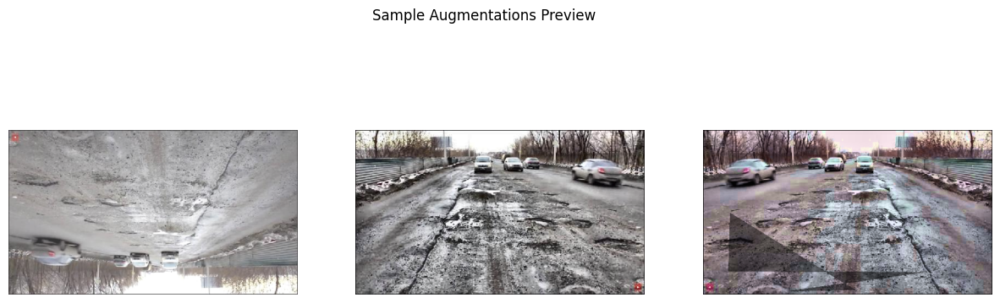

Ultralytics 8.3.118 🚀 Python-3.11.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/yolo_data/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=ram, device=None, workers=4, project=None, name=augmented_train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=

train: Scanning /kaggle/working/yolo_data/labels/train.cache... 497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 497/497 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.5GB RAM): 100%|██████████| 497/497 [00:07<00:00, 67.59it/s] 

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1732.1±1525.6 MB/s, size: 1719.5 KB)


val: Scanning /kaggle/working/yolo_data/labels/valid.cache... 93 images, 0 backgrounds, 0 corrupt: 100%|██████████| 93/93 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 93/93 [00:01<00:00, 49.00it/s] 


Plotting labels to runs/detect/augmented_train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/augmented_train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.36G      2.164      3.068      1.924          3        640: 100%|██████████| 32/32 [00:05<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.63it/s]

                   all         93        239    0.00631      0.427     0.0479     0.0166

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/50      2.51G      1.879      2.264      1.706          6        640: 100%|██████████| 32/32 [00:05<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.53it/s]

                   all         93        239      0.494     0.0859      0.127     0.0411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.52G      1.892       2.14      1.708          4        640: 100%|██████████| 32/32 [00:05<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.14it/s]

                   all         93        239      0.364        0.1     0.0867     0.0365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.52G      1.929      2.115      1.727          3        640: 100%|██████████| 32/32 [00:05<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.16it/s]

                   all         93        239      0.152      0.151     0.0867     0.0312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.52G        1.9      2.014       1.71          9        640: 100%|██████████| 32/32 [00:05<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.20it/s]

                   all         93        239      0.284       0.29        0.2      0.069



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.52G      1.854       1.97      1.705          5        640: 100%|██████████| 32/32 [00:05<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.12it/s]

                   all         93        239      0.481      0.393      0.378      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.52G      1.845      1.933      1.704          5        640: 100%|██████████| 32/32 [00:05<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.33it/s]

                   all         93        239      0.492      0.409       0.39      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.52G      1.787      1.811      1.633          5        640: 100%|██████████| 32/32 [00:05<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.20it/s]

                   all         93        239      0.488      0.423      0.358      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.52G      1.804      1.823      1.661          5        640: 100%|██████████| 32/32 [00:05<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.08it/s]

                   all         93        239      0.539      0.444      0.423      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.52G      1.786      1.791      1.618          9        640: 100%|██████████| 32/32 [00:05<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.28it/s]

                   all         93        239      0.542      0.439      0.378      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.52G       1.76       1.74      1.611          4        640: 100%|██████████| 32/32 [00:05<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.14it/s]

                   all         93        239       0.55      0.435      0.425      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.52G      1.737      1.657      1.568          1        640: 100%|██████████| 32/32 [00:05<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.12it/s]

                   all         93        239      0.582      0.527      0.501      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.52G      1.755      1.675       1.58          3        640: 100%|██████████| 32/32 [00:05<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.50it/s]

                   all         93        239      0.574      0.414       0.45      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.52G      1.701       1.62      1.558          7        640: 100%|██████████| 32/32 [00:05<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.67it/s]

                   all         93        239      0.634      0.469       0.47      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.52G      1.729      1.597      1.592         10        640: 100%|██████████| 32/32 [00:05<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.69it/s]


                   all         93        239      0.634      0.485      0.501      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.52G      1.737      1.643      1.585         20        640: 100%|██████████| 32/32 [00:05<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.10it/s]

                   all         93        239      0.725      0.497      0.563      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.52G      1.704      1.574      1.566         11        640: 100%|██████████| 32/32 [00:05<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.11it/s]

                   all         93        239      0.631       0.54      0.571      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.52G      1.676      1.547      1.536          5        640: 100%|██████████| 32/32 [00:05<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.35it/s]

                   all         93        239      0.631      0.527      0.533      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.52G      1.644      1.468      1.515          3        640: 100%|██████████| 32/32 [00:05<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.43it/s]

                   all         93        239      0.553      0.512        0.5      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.52G      1.624      1.479      1.483          1        640: 100%|██████████| 32/32 [00:05<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.40it/s]

                   all         93        239       0.59      0.527      0.492       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.52G      1.618      1.441      1.483          3        640: 100%|██████████| 32/32 [00:05<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.80it/s]


                   all         93        239      0.591      0.538      0.529      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.52G      1.625      1.454      1.501          2        640: 100%|██████████| 32/32 [00:05<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.52it/s]

                   all         93        239      0.633      0.549      0.535      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.52G       1.62      1.419      1.495          8        640: 100%|██████████| 32/32 [00:05<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.32it/s]

                   all         93        239      0.724      0.536      0.577      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.52G      1.643      1.428      1.523          6        640: 100%|██████████| 32/32 [00:05<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.23it/s]

                   all         93        239      0.723      0.536       0.57      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.52G      1.606      1.422      1.505          3        640: 100%|██████████| 32/32 [00:05<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.43it/s]

                   all         93        239      0.657      0.531      0.552      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.52G      1.564      1.356      1.473          4        640: 100%|██████████| 32/32 [00:05<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.10it/s]

                   all         93        239      0.645       0.49      0.492      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.52G      1.606      1.382      1.498         17        640: 100%|██████████| 32/32 [00:05<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.63it/s]

                   all         93        239      0.736      0.498      0.563      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.52G      1.629      1.389      1.497          8        640: 100%|██████████| 32/32 [00:05<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.17it/s]

                   all         93        239      0.648      0.515      0.501      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.52G      1.599      1.392      1.472          3        640: 100%|██████████| 32/32 [00:05<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.29it/s]

                   all         93        239      0.666      0.569      0.572      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.52G       1.55      1.325      1.454          3        640: 100%|██████████| 32/32 [00:05<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.18it/s]

                   all         93        239      0.694      0.515      0.552      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.52G      1.583      1.345      1.455          5        640: 100%|██████████| 32/32 [00:05<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.94it/s]

                   all         93        239      0.674      0.573      0.546      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.52G      1.533      1.288      1.434          7        640: 100%|██████████| 32/32 [00:05<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.36it/s]

                   all         93        239      0.729      0.582      0.626      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.52G       1.51      1.284      1.427         15        640: 100%|██████████| 32/32 [00:05<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.96it/s]

                   all         93        239      0.766      0.548      0.599      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.52G      1.507      1.277      1.417          3        640: 100%|██████████| 32/32 [00:05<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.77it/s]

                   all         93        239      0.699      0.598      0.621       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.52G      1.522      1.265      1.436          3        640: 100%|██████████| 32/32 [00:05<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.35it/s]

                   all         93        239      0.711      0.573        0.6       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.52G      1.518      1.249      1.439          6        640: 100%|██████████| 32/32 [00:05<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.30it/s]

                   all         93        239      0.739      0.544      0.577      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.52G       1.53       1.26      1.424          8        640: 100%|██████████| 32/32 [00:05<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.06it/s]

                   all         93        239      0.776      0.523      0.577      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.52G       1.46      1.179      1.381          2        640: 100%|██████████| 32/32 [00:05<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.98it/s]

                   all         93        239      0.721      0.586       0.64      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.52G       1.52      1.242       1.43         12        640: 100%|██████████| 32/32 [00:05<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.79it/s]

                   all         93        239      0.649      0.604      0.604      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.52G      1.501      1.217       1.41          5        640: 100%|██████████| 32/32 [00:05<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.31it/s]

                   all         93        239      0.726      0.531      0.576      0.237


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.52G      1.611      1.644      1.382          2        640: 100%|██████████| 32/32 [00:05<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.86it/s]

                   all         93        239      0.608      0.469      0.508      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.52G      1.505      1.298       1.32          1        640: 100%|██████████| 32/32 [00:04<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.31it/s]

                   all         93        239      0.721      0.531      0.546      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.52G      1.501      1.232      1.328          2        640: 100%|██████████| 32/32 [00:04<00:00,  6.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.19it/s]

                   all         93        239      0.688      0.582      0.572      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.52G      1.513       1.22      1.364          1        640: 100%|██████████| 32/32 [00:04<00:00,  7.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.35it/s]

                   all         93        239      0.651      0.586      0.567      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.52G      1.495      1.149      1.291          5        640: 100%|██████████| 32/32 [00:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.95it/s]

                   all         93        239      0.719      0.603       0.63      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.52G      1.448      1.137      1.269          2        640: 100%|██████████| 32/32 [00:04<00:00,  7.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.29it/s]

                   all         93        239      0.722      0.577      0.616      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.52G      1.518      1.168      1.276          2        640: 100%|██████████| 32/32 [00:04<00:00,  7.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.13it/s]

                   all         93        239      0.707      0.607      0.629      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.52G      1.475      1.092      1.292          1        640: 100%|██████████| 32/32 [00:04<00:00,  7.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.28it/s]

                   all         93        239      0.727      0.612      0.625      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.52G       1.46      1.121      1.266          3        640: 100%|██████████| 32/32 [00:04<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.32it/s]

                   all         93        239      0.685      0.611      0.611      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.52G      1.417      1.036      1.268          1        640: 100%|██████████| 32/32 [00:04<00:00,  7.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.62it/s]

                   all         93        239      0.691      0.599      0.631      0.293



50 epochs completed in 0.085 hours.
Optimizer stripped from runs/detect/augmented_train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/augmented_train2/weights/best.pt, 6.2MB

Validating runs/detect/augmented_train2/weights/best.pt...
Ultralytics 8.3.118 🚀 Python-3.11.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]


                   all         93        239      0.675        0.6      0.607      0.298
             plot_hole         93        239      0.675        0.6      0.607      0.298


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 2.0ms preprocess, 11.7ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/augmented_train2


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/runs/detect/augmented_train/results.png'

In [3]:
# %% [markdown]
# # YOLOv8 Training - Enhanced with Advanced Augmentation

# %% [code]
# Environment Setup
!pip uninstall -y pylibraft-cu12 rmm-cu12 pylibcugraph-cu12 cuml-cu12 cuvs-cu12 2>/dev/null || echo "No conflicts found"
!pip install ultralytics albumentations matplotlib --quiet
!pip install torch==2.0.1 torchvision==0.15.2 --extra-index-url https://download.pytorch.org/whl/cu118 --quiet

# %% [code]
# Dataset Organization
import os
import shutil
import cv2
import albumentations as A
import matplotlib.pyplot as plt
from PIL import Image
from ultralytics import YOLO

def organize_dataset(source_path, target_dir, split_name):
    """Organizes dataset with augmentation preview"""
    img_dir = f'{target_dir}/images/{split_name}'
    lbl_dir = f'{target_dir}/labels/{split_name}'
    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(lbl_dir, exist_ok=True)
    
    preview_shown = False
    
    for root, _, files in os.walk(source_path):
        for file in files:
            src = os.path.join(root, file)
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                shutil.copy(src, f'{img_dir}/{file}')
                if not preview_shown and split_name == 'train':
                    show_augmentation_preview(src)
                    preview_shown = True
            elif file.endswith('.txt'):
                shutil.copy(src, f'{lbl_dir}/{file}')

def show_augmentation_preview(image_path):
    """Displays sample augmentations"""
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    transform = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.2),
        A.RandomRotate90(p=0.3),
        A.RandomBrightnessContrast(p=0.4),
        A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
        A.CLAHE(p=0.2),
        A.Blur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.ToGray(p=0.1),
        A.RandomShadow(p=0.1),
        A.RandomSunFlare(p=0.1),
    ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))
    
    plt.figure(figsize=(15, 5))
    for i in range(3):
        transformed = transform(image=img, bboxes=[[0.5,0.5,0.2,0.2]], class_labels=[0])
        plt.subplot(1, 3, i+1)
        plt.imshow(transformed['image'])
        plt.axis('off')
    plt.suptitle('Sample Augmentations Preview')
    plt.show()

# %% [code]
# Dataset Setup
dataset_path = '/kaggle/working/yolo_data'
os.makedirs(dataset_path, exist_ok=True)

organize_dataset('/kaggle/input/data-set/train/train/train', dataset_path, 'train')
organize_dataset('/kaggle/input/data-set/valid/valid/valid', dataset_path, 'valid')
organize_dataset('/kaggle/input/data-set/test/test/test', dataset_path, 'test')

# %% [code]
# YOLO Configuration
with open(f'{dataset_path}/data.yaml', 'w') as f:
    f.write(f"""
path: {dataset_path}
train: images/train
val: images/valid
test: images/test

names:
  0: plot_hole
  1: defect
""")

# %% [code]
# Enhanced Training with Augmentation
model = YOLO('yolov8n.pt')

augmentation_params = {
    'hsv_h': 0.02,
    'hsv_s': 0.8,
    'hsv_v': 0.4,
    'degrees': 15.0,
    'translate': 0.2,
    'scale': 0.3,
    'shear': 5.0,
    'perspective': 0.001,
    'fliplr': 0.5,
    'flipud': 0.2,
    'mosaic': 1.0,
    'mixup': 0.2,
    'copy_paste': 0.2,
    'erasing': 0.3,
    'auto_augment': 'randaugment'
}

results = model.train(
    data=f'{dataset_path}/data.yaml',
    epochs=50,             # <-- Changed to 50 EPOCHS ✅
    imgsz=640,
    batch=16,
    cache='ram',
    workers=4,
    name='augmented_train',
    augment=True,
    **augmentation_params
)

# %% [code]
# Post-Training Analysis
from IPython.display import Image as IPImage

display(IPImage(filename='/kaggle/working/runs/detect/augmented_train/results.png'))

metrics = model.val(
    data=f'{dataset_path}/data.yaml',
    augment=True,
    conf=0.3,   # <-- CONF updated
    iou=0.6
)

print(f"\nValidation mAP50: {metrics.box.map50:.4f}")
print(f"Validation mAP50-95: {metrics.box.map:.4f}")


GPU available: True
Device name: Tesla T4
Ultralytics 8.3.118 🚀 Python-3.11.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/yolo_data/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect, name=augmented_train25, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=

train: Scanning /kaggle/working/yolo_data/labels/train.cache... 497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 497/497 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1160.6±1630.1 MB/s, size: 1298.9 KB)


val: Scanning /kaggle/working/yolo_data/labels/valid.cache... 93 images, 0 backgrounds, 0 corrupt: 100%|██████████| 93/93 [00:00<?, ?it/s]


Plotting labels to runs/detect/augmented_train25/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/augmented_train25
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.54G      1.878      3.318      1.567          9        640: 100%|██████████| 32/32 [00:13<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.94it/s]

                   all         93        239    0.00583      0.331     0.0945     0.0437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.69G      1.749      2.563       1.45          3        640: 100%|██████████| 32/32 [00:13<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.58it/s]

                   all         93        239      0.278     0.0795      0.101     0.0454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50       2.7G      1.825      2.379      1.491          1        640: 100%|██████████| 32/32 [00:13<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.36it/s]

                   all         93        239      0.288      0.188      0.135      0.051



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       2.7G      1.834      2.283      1.488          3        640: 100%|██████████| 32/32 [00:13<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.66it/s]

                   all         93        239      0.394      0.406      0.315      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50       2.7G      1.841      2.242      1.486          1        640: 100%|██████████| 32/32 [00:13<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.74it/s]

                   all         93        239      0.292      0.176      0.168     0.0767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       2.7G       1.73      1.982      1.458          7        640: 100%|██████████| 32/32 [00:12<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.43it/s]

                   all         93        239      0.161      0.146      0.104     0.0478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       2.7G      1.741      1.897      1.444          7        640: 100%|██████████| 32/32 [00:13<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.84it/s]

                   all         93        239      0.618      0.432      0.468      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       2.7G      1.625      1.778      1.395          1        640: 100%|██████████| 32/32 [00:14<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.66it/s]

                   all         93        239      0.524      0.498      0.462      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50       2.7G      1.621      1.711      1.359          2        640: 100%|██████████| 32/32 [00:15<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.96it/s]

                   all         93        239      0.621      0.485      0.473      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50       2.7G      1.668      1.707      1.329          7        640: 100%|██████████| 32/32 [00:14<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.41it/s]


                   all         93        239      0.478      0.515      0.445      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50       2.7G      1.643      1.603      1.364          3        640: 100%|██████████| 32/32 [00:13<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.64it/s]

                   all         93        239       0.62      0.473      0.455      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50       2.7G      1.647      1.587      1.372          4        640: 100%|██████████| 32/32 [00:15<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.37it/s]

                   all         93        239      0.446      0.484      0.395      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50       2.7G      1.618      1.488      1.316          4        640: 100%|██████████| 32/32 [00:14<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.72it/s]

                   all         93        239      0.548       0.54      0.548       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50       2.7G      1.633      1.533      1.322          1        640: 100%|██████████| 32/32 [00:13<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.43it/s]

                   all         93        239      0.671      0.477      0.536      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       2.7G      1.525      1.449      1.293          1        640: 100%|██████████| 32/32 [00:13<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.51it/s]

                   all         93        239      0.626      0.515      0.548      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       2.7G      1.512      1.333      1.292          2        640: 100%|██████████| 32/32 [00:14<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.15it/s]

                   all         93        239      0.683      0.561      0.577      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.71G       1.51       1.31      1.278         17        640: 100%|██████████| 32/32 [00:13<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.87it/s]

                   all         93        239      0.689      0.536      0.576      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.71G       1.43      1.255      1.241          4        640: 100%|██████████| 32/32 [00:14<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.49it/s]

                   all         93        239      0.725      0.569      0.618      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.71G       1.47      1.262      1.249          4        640: 100%|██████████| 32/32 [00:13<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.43it/s]

                   all         93        239      0.711      0.546      0.592      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.71G      1.436      1.239      1.237          6        640: 100%|██████████| 32/32 [00:14<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.22it/s]


                   all         93        239      0.655      0.569      0.608      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.71G      1.419      1.241      1.246          5        640: 100%|██████████| 32/32 [00:14<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.80it/s]

                   all         93        239      0.643      0.603      0.618      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.71G      1.409      1.289      1.207          0        640: 100%|██████████| 32/32 [00:13<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.75it/s]

                   all         93        239      0.619      0.606      0.595       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.71G      1.468      1.254      1.253          5        640: 100%|██████████| 32/32 [00:14<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.21it/s]

                   all         93        239      0.648      0.578      0.584      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.71G      1.417      1.256      1.238          1        640: 100%|██████████| 32/32 [00:13<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.89it/s]

                   all         93        239      0.652      0.527      0.567      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.71G      1.389      1.161      1.203          5        640: 100%|██████████| 32/32 [00:14<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.88it/s]

                   all         93        239      0.659      0.598      0.624      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.71G      1.399      1.157      1.228          9        640: 100%|██████████| 32/32 [00:12<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.17it/s]

                   all         93        239      0.717      0.569      0.632        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.71G      1.376      1.195      1.214          2        640: 100%|██████████| 32/32 [00:13<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.10it/s]

                   all         93        239      0.612      0.594      0.594      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.71G      1.374      1.106      1.197          3        640: 100%|██████████| 32/32 [00:13<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.87it/s]

                   all         93        239      0.608      0.619      0.612      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.71G      1.388      1.133      1.217          2        640: 100%|██████████| 32/32 [00:13<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.33it/s]

                   all         93        239      0.696      0.594      0.609      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.71G       1.31      1.091      1.181         14        640: 100%|██████████| 32/32 [00:14<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.07it/s]

                   all         93        239      0.673      0.577      0.624      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.71G      1.283      1.032      1.163          1        640: 100%|██████████| 32/32 [00:13<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.42it/s]

                   all         93        239      0.729      0.561      0.659      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.71G      1.284      1.032      1.185          1        640: 100%|██████████| 32/32 [00:14<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.31it/s]


                   all         93        239      0.723      0.649      0.678      0.342

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.71G      1.308      1.009      1.155          2        640: 100%|██████████| 32/32 [00:13<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         93        239      0.715      0.644      0.663      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.71G      1.311      1.041      1.166          9        640: 100%|██████████| 32/32 [00:12<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.28it/s]

                   all         93        239      0.716      0.573      0.636      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.71G      1.228      1.124      1.107          0        640: 100%|██████████| 32/32 [00:13<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.86it/s]

                   all         93        239      0.723      0.624      0.664      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.71G      1.343      1.034      1.171          9        640: 100%|██████████| 32/32 [00:13<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.66it/s]

                   all         93        239      0.754      0.628       0.67      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.71G      1.262     0.9938      1.133          4        640: 100%|██████████| 32/32 [00:13<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.41it/s]

                   all         93        239      0.713      0.582      0.623      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.71G      1.233      0.977      1.104          0        640: 100%|██████████| 32/32 [00:13<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.05it/s]

                   all         93        239      0.724      0.658       0.66      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.71G      1.233     0.9266      1.135         10        640: 100%|██████████| 32/32 [00:13<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.71it/s]

                   all         93        239      0.689      0.636      0.651      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.71G      1.252      0.913      1.134          3        640: 100%|██████████| 32/32 [00:13<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.85it/s]

                   all         93        239      0.765      0.611      0.676      0.344


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.71G       1.24     0.9369      1.086          2        640: 100%|██████████| 32/32 [00:13<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.80it/s]

                   all         93        239      0.769      0.611      0.681      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.71G      1.129     0.8726      1.061          1        640: 100%|██████████| 32/32 [00:14<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.58it/s]


                   all         93        239       0.74      0.628      0.689      0.364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.71G      1.127     0.8863      1.087          2        640: 100%|██████████| 32/32 [00:13<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.15it/s]


                   all         93        239      0.782      0.598      0.688      0.364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.71G      1.115     0.8676      1.069          1        640: 100%|██████████| 32/32 [00:13<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.43it/s]

                   all         93        239      0.729      0.632      0.682      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.71G      1.135     0.8104       1.05          5        640: 100%|██████████| 32/32 [00:13<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.42it/s]

                   all         93        239      0.769      0.626      0.683      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.71G       1.13     0.7958      1.059          2        640: 100%|██████████| 32/32 [00:14<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.87it/s]

                   all         93        239      0.761      0.619      0.681      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.71G      1.129     0.8125      1.037          2        640: 100%|██████████| 32/32 [00:13<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.34it/s]

                   all         93        239       0.75      0.649      0.682      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.71G      1.176     0.7957      1.067          1        640: 100%|██████████| 32/32 [00:15<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.39it/s]

                   all         93        239      0.754       0.64      0.689      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.71G      1.092     0.8066      1.024          2        640: 100%|██████████| 32/32 [00:13<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.34it/s]

                   all         93        239      0.765      0.628      0.693       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.71G      1.066     0.7271      1.014          1        640: 100%|██████████| 32/32 [00:13<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.59it/s]

                   all         93        239      0.729      0.665      0.701      0.379



50 epochs completed in 0.208 hours.
Optimizer stripped from runs/detect/augmented_train25/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/augmented_train25/weights/best.pt, 6.2MB

Validating runs/detect/augmented_train25/weights/best.pt...
Ultralytics 8.3.118 🚀 Python-3.11.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.20it/s]


                   all         93        239      0.762      0.582      0.675      0.364
             plot_hole         93        239      0.762      0.582      0.675      0.364


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 1.4ms preprocess, 4.6ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/augmented_train25


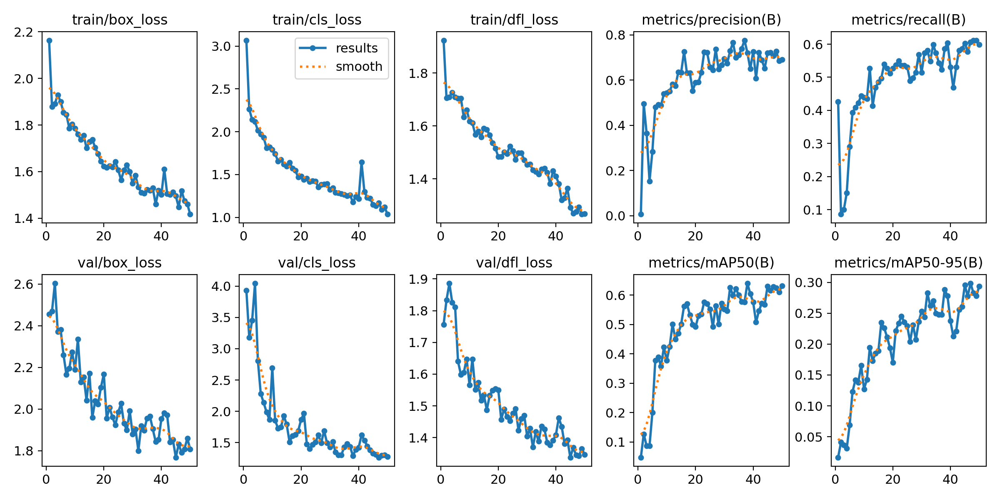

Ultralytics 8.3.118 🚀 Python-3.11.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3185.6±2367.1 MB/s, size: 1281.3 KB)


val: Scanning /kaggle/working/yolo_data/labels/valid.cache... 93 images, 0 backgrounds, 0 corrupt: 100%|██████████| 93/93 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.94it/s]


                   all         93        239      0.721      0.594      0.666      0.359
             plot_hole         93        239      0.721      0.594      0.666      0.359


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 1.2ms preprocess, 14.7ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/augmented_train252
Could not plot mAP50 curve: [Errno 2] No such file or directory: 'runs/detect/augmented_train2/results.yaml'
Ultralytics 8.3.118 🚀 Python-3.11.11 torch-2.0.1+cu118 CPU (Intel Xeon 2.00GHz)

PyTorch: starting from 'runs/detect/augmented_train25/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (6.0 MB)
requirements: Ultralytics requirements ['onnxslim', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.5/144.5 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.8/280.8 MB 305.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 255.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 324.2 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 9.7s, installed 2 packages: ['onnxslim', 'onnxruntime-gpu']
WA

'runs/detect/augmented_train25/weights/best.onnx'

In [7]:
# 1. ✅ Install Ultralytics (YOLOv8)
!pip install ultralytics

# 2. ✅ Import required libraries
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from IPython.display import Image, display
import yaml

# 3. ✅ Check GPU
import torch
print('GPU available:', torch.cuda.is_available())
print('Device name:', torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU')

# 4. ✅ Define your paths
# -- Make sure you have the dataset (images + labels) and data.yaml ready
DATA_YAML_PATH = '/kaggle/working/yolo_data/data.yaml'  # <-- 🔥 CHANGE THIS TO YOUR data.yaml path

# 5. ✅ Load YOLOv8 model
model = YOLO('yolov8n.pt')  # or 'yolov8s.pt' for slightly bigger model

# 6. ✅ Train the model
results = model.train(
    data=DATA_YAML_PATH,
    epochs=50,            # <-- 🔥 Training for 50 epochs
    imgsz=640,            # Image size
    batch=16,             # Batch size
    project='runs/detect',
    name='augmented_train2',  # Save everything inside this folder
    augment=True,
    verbose=True,
)

# 7. ✅ Show training results
try:
    display(Image(filename='runs/detect/augmented_train2/results.png'))
except FileNotFoundError:
    print("results.png not found. Training may not have completed or path is wrong.")

# Validate model on the test set
model.val(data=f'{dataset_path}/data.yaml', imgsz=640)

# 9. ✅ Optional: Plot mAP50 vs Epoch
try:
    # results.yaml contains training curves
    result_yaml_path = 'runs/detect/augmented_train2/results.yaml'
    
    with open(result_yaml_path, 'r') as f:
        training_results = yaml.safe_load(f)

    plt.figure(figsize=(10,5))
    plt.plot(training_results['metrics/mAP50'], label='mAP50', marker='o')
    plt.title('mAP50 over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('mAP50')
    plt.grid()
    plt.legend()
    plt.show()

except Exception as e:
    print(f"Could not plot mAP50 curve: {e}")

# 10. ✅ Save final model if you want
model.export(format='onnx')  # or 'torchscript', 'coreml', etc


In [10]:
# 1. Import libraries
from ultralytics import YOLO
import pandas as pd
import os
import cv2

# 2. Load your trained model
model = YOLO('/kaggle/working/runs/detect/augmented_train2/weights/best.pt')  # <-- your model path

# 3. Prepare submission data
submission_data = []

# 4. Predict on each test image
test_images_path = '/kaggle/working/yolo_data/images/test'

for img_name in os.listdir(test_images_path):
    if not img_name.lower().endswith(('.jpg', '.png', '.jpeg')):
        continue
    
    img_path = os.path.join(test_images_path, img_name)
    
    # Read image to get dimensions (height, width)
    img = cv2.imread(img_path)
    img_height, img_width = img.shape[:2]
    
    # Predict with conf=0.3 (competition standard)
    results = model.predict(img_path, conf=0.3)

    # Process prediction results
    for i, box in enumerate(results[0].boxes.xyxyn.cpu().numpy()):  # xyxyn = normalized (0-1)
        submission_data.append({
            'unique_id': f"{os.path.splitext(img_name)[0]}_{i}",
            'image_id': os.path.splitext(img_name)[0],
            'xmin': round(box[0], 6),
            'ymin': round(box[1], 6),
            'xmax': round(box[2], 6),
            'ymax': round(box[3], 6)
        })

# 5. Save predictions to CSV
submission_df = pd.DataFrame(submission_data)
submission_df.to_csv('/kaggle/working/submission_attempt2.csv', index=False, float_format='%.6f')

print(f"✅ Saved {len(submission_df)} normalized predictions to 'submission_attempt2.csv'")
print("📦 Sample predictions:")
print(submission_df.head(3))



image 1/64 /kaggle/working/yolo_data/images/test/G0010124.JPG: 480x640 2 plot_holes, 19.4ms
image 2/64 /kaggle/working/yolo_data/images/test/G0010760.JPG: 480x640 3 plot_holes, 19.1ms
image 3/64 /kaggle/working/yolo_data/images/test/G0010770.JPG: 480x640 3 plot_holes, 19.3ms
image 4/64 /kaggle/working/yolo_data/images/test/G0011427.JPG: 480x640 (no detections), 19.2ms
image 5/64 /kaggle/working/yolo_data/images/test/G0011621.JPG: 480x640 2 plot_holes, 18.8ms
image 6/64 /kaggle/working/yolo_data/images/test/G0011764.JPG: 480x640 2 plot_holes, 18.9ms
image 7/64 /kaggle/working/yolo_data/images/test/G0011766.JPG: 480x640 1 plot_hole, 19.0ms
image 8/64 /kaggle/working/yolo_data/images/test/G0020197.JPG: 480x640 3 plot_holes, 19.3ms
image 9/64 /kaggle/working/yolo_data/images/test/G0020206.JPG: 480x640 1 plot_hole, 19.1ms
image 10/64 /kaggle/working/yolo_data/images/test/G0022106.JPG: 480x640 1 plot_hole, 19.0ms
image 11/64 /kaggle/working/yolo_data/images/test/G0022107.JPG: 480x640 3 plot

In [15]:
from sklearn.model_selection import KFold
import os
from ultralytics import YOLO

# Path to the image directory and data.yaml file
IMAGE_DIR = '/kaggle/working/yolo_data/images/train'  # Adjust path to your train images
DATA_YAML_PATH = '/kaggle/working/yolo_data/data.yaml'  # Path to your data.yaml

# Get the list of images in your directory
image_files = os.listdir(IMAGE_DIR)
num_samples = len(image_files)

# Set n_splits to a number smaller than or equal to the number of samples
n_splits = min(5, num_samples)

# Initialize KFold with the correct number of splits
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
fold_num = 1

# Load your YOLOv8 model
model = YOLO('yolov8n.pt')  # Use yolov8n.pt or another pre-trained model as needed

# 8. ✅ Training Loop with Cross-Validation
for train_index, val_index in kf.split(image_files):  # Split based on the images list
    print(f"Training on fold {fold_num} of {kf.get_n_splits()}...")

    # Define train and validation splits
    train_data = [os.path.join(IMAGE_DIR, image_files[i]) for i in train_index]
    val_data = [os.path.join(IMAGE_DIR, image_files[i]) for i in val_index]
    
    # Update data.yaml to point to the correct train/val splits (manual or script-based update required)

    # 9. ✅ Train the model for this fold
    results = model.train(
        data=DATA_YAML_PATH,  # Path to your data.yaml file (make sure it points to the correct train/val data)
        epochs=50,            # Train for 50 epochs (adjust as needed)
        imgsz=640,            # Image size
        batch=16,             # Batch size
        project='runs/detect', 
        name=f'augmented_train_fold{fold_num}',  # Name this fold's run
        augment=True,         # Enable augmentations (you can adjust this for more aggressive augmentations)
        weight_decay=0.0005,  # L2 regularization to prevent overfitting
        verbose=True,         # Display detailed logs
        patience=5,           # Use patience for early stopping, adjust if needed
    )

    fold_num += 1  # Move to the next fold


Training on fold 1 of 5...
Ultralytics 8.3.118 🚀 Python-3.11.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/yolo_data/data.yaml, epochs=50, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect, name=augmented_train_fold1, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_l

train: Scanning /kaggle/working/yolo_data/labels/train.cache... 497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 497/497 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1363.0±1815.0 MB/s, size: 1298.9 KB)


val: Scanning /kaggle/working/yolo_data/labels/valid.cache... 93 images, 0 backgrounds, 0 corrupt: 100%|██████████| 93/93 [00:00<?, ?it/s]


Plotting labels to runs/detect/augmented_train_fold1/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/augmented_train_fold1
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.21G      1.878      3.318      1.567          9        640: 100%|██████████| 32/32 [00:11<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.89it/s]

                   all         93        239    0.00583      0.331     0.0945     0.0437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.36G      1.749      2.563       1.45          3        640: 100%|██████████| 32/32 [00:11<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.21it/s]

                   all         93        239      0.278     0.0795      0.101     0.0454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.36G      1.825      2.379      1.491          1        640: 100%|██████████| 32/32 [00:11<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.27it/s]

                   all         93        239      0.288      0.188      0.135      0.051



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.36G      1.834      2.283      1.488          3        640: 100%|██████████| 32/32 [00:10<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.06it/s]

                   all         93        239      0.394      0.406      0.315      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.36G      1.841      2.242      1.486          1        640: 100%|██████████| 32/32 [00:11<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.29it/s]

                   all         93        239      0.292      0.176      0.168     0.0767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.36G       1.73      1.982      1.458          7        640: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.26it/s]


                   all         93        239      0.161      0.146      0.104     0.0478

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.36G      1.741      1.897      1.444          7        640: 100%|██████████| 32/32 [00:11<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.56it/s]


                   all         93        239      0.618      0.432      0.468      0.188

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.36G      1.625      1.778      1.395          1        640: 100%|██████████| 32/32 [00:11<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.63it/s]


                   all         93        239      0.524      0.498      0.462      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.36G      1.621      1.711      1.359          2        640: 100%|██████████| 32/32 [00:11<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.26it/s]


                   all         93        239      0.621      0.485      0.473      0.185

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.36G      1.668      1.707      1.329          7        640: 100%|██████████| 32/32 [00:11<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.12it/s]

                   all         93        239      0.478      0.515      0.445      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.36G      1.643      1.603      1.364          3        640: 100%|██████████| 32/32 [00:10<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.87it/s]

                   all         93        239       0.62      0.473      0.455      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.36G      1.647      1.587      1.372          4        640: 100%|██████████| 32/32 [00:11<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.20it/s]

                   all         93        239      0.446      0.484      0.395      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.36G      1.618      1.488      1.316          4        640: 100%|██████████| 32/32 [00:11<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.21it/s]

                   all         93        239      0.548       0.54      0.548       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.36G      1.633      1.533      1.322          1        640: 100%|██████████| 32/32 [00:10<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.86it/s]

                   all         93        239      0.671      0.477      0.536      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.36G      1.525      1.449      1.293          1        640: 100%|██████████| 32/32 [00:11<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.28it/s]

                   all         93        239      0.626      0.515      0.548      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.36G      1.512      1.333      1.292          2        640: 100%|██████████| 32/32 [00:11<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.75it/s]

                   all         93        239      0.683      0.561      0.577      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.36G       1.51       1.31      1.278         17        640: 100%|██████████| 32/32 [00:10<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.40it/s]

                   all         93        239      0.689      0.536      0.576      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.36G       1.43      1.255      1.241          4        640: 100%|██████████| 32/32 [00:11<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.48it/s]

                   all         93        239      0.725      0.569      0.618      0.308


KeyboardInterrupt: 

In [19]:
from ultralytics import YOLO
import os
import shutil

# Step 1: Load the original model
model = YOLO('yolov8n.pt')

# Step 2: Generate pseudo-labels on the test set
pseudo_output_dir = '/kaggle/working/pseudo_labels'
os.makedirs(pseudo_output_dir, exist_ok=True)
model.predict(
    source='/kaggle/working/yolo_data/images/test', 
    save_txt=True, 
    save_conf=True, 
    project=pseudo_output_dir,
    name='pseudo',
    conf=0.3
)

# Step 3: Move pseudo-labels into training label directory
pseudo_labels = f'{pseudo_output_dir}/pseudo/labels'
train_labels = '/kaggle/working/yolo_data/labels/train'
for file in os.listdir(pseudo_labels):
    shutil.copy(os.path.join(pseudo_labels, file), os.path.join(train_labels, file))

# Step 4: Fine-tune model using both original and pseudo-labeled data
augmentation_params = {
    'hsv_h': 0.05,
    'hsv_s': 0.7,
    'hsv_v': 0.5,
    'degrees': 20.0,
    'translate': 0.2,
    'scale': 0.3,
    'shear': 5.0,
    'perspective': 0.002,
    'fliplr': 0.5,
    'flipud': 0.3,
    'mosaic': 1.0,
    'mixup': 0.3,
    'copy_paste': 0.25,
    'erasing': 0.3,
    'auto_augment': 'randaugment'
}

model.train(
    data='/kaggle/working/yolo_data/data.yaml',
    epochs=10,  # short fine-tune, does not go beyond total 50
    imgsz=640,
    batch=16,
    name='fine_tuned_with_pseudo',
    cache='ram',
    workers=4,
    augment=True,
    **augmentation_params
)

# Step 5: Evaluate using TTA
metrics = model.val(
    data='/kaggle/working/yolo_data/data.yaml',
    augment=True,  # TTA!
    conf=0.3,
    iou=0.6
)

print(f"\n✅ Fine-tuned mAP50: {metrics.box.map50:.4f}")
print(f"✅ Fine-tuned mAP50-95: {metrics.box.map:.4f}")



image 1/64 /kaggle/working/yolo_data/images/test/G0010124.JPG: 480x640 (no detections), 82.6ms
image 2/64 /kaggle/working/yolo_data/images/test/G0010760.JPG: 480x640 1 kite, 6.3ms
image 3/64 /kaggle/working/yolo_data/images/test/G0010770.JPG: 480x640 1 bird, 6.3ms
image 4/64 /kaggle/working/yolo_data/images/test/G0011427.JPG: 480x640 1 person, 3 cars, 6.3ms
image 5/64 /kaggle/working/yolo_data/images/test/G0011621.JPG: 480x640 1 stop sign, 6.4ms
image 6/64 /kaggle/working/yolo_data/images/test/G0011764.JPG: 480x640 1 car, 6.3ms
image 7/64 /kaggle/working/yolo_data/images/test/G0011766.JPG: 480x640 (no detections), 6.3ms
image 8/64 /kaggle/working/yolo_data/images/test/G0020197.JPG: 480x640 (no detections), 6.3ms
image 9/64 /kaggle/working/yolo_data/images/test/G0020206.JPG: 480x640 (no detections), 6.3ms
image 10/64 /kaggle/working/yolo_data/images/test/G0022106.JPG: 480x640 1 car, 6.4ms
image 11/64 /kaggle/working/yolo_data/images/test/G0022107.JPG: 480x640 1 car, 6.3ms
image 12/64 /

train: Scanning /kaggle/working/yolo_data/labels/train.cache... 497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 497/497 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.5GB RAM): 100%|██████████| 497/497 [00:07<00:00, 70.98it/s] 

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1362.1±1629.2 MB/s, size: 1719.5 KB)


val: Scanning /kaggle/working/yolo_data/labels/valid.cache... 93 images, 0 backgrounds, 0 corrupt: 100%|██████████| 93/93 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 93/93 [00:01<00:00, 48.23it/s] 


Plotting labels to runs/detect/fine_tuned_with_pseudo/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/fine_tuned_with_pseudo
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.36G      3.011      4.805      2.613          4        640: 100%|██████████| 32/32 [00:05<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.67it/s]

                   all         93        239    0.00139     0.0586    0.00203   0.000762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.36G      2.396      3.644      2.136          2        640: 100%|██████████| 32/32 [00:04<00:00,  7.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.17it/s]


                   all         93        239      0.286     0.0502     0.0741      0.023

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.36G      2.104       3.06      1.804          1        640: 100%|██████████| 32/32 [00:04<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.18it/s]


                   all         93        239      0.397      0.289      0.234     0.0694

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.36G      2.129      2.892      1.788          2        640: 100%|██████████| 32/32 [00:04<00:00,  7.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.33it/s]

                   all         93        239      0.281      0.247      0.172     0.0523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.36G      2.078       2.64      1.737          7        640: 100%|██████████| 32/32 [00:04<00:00,  7.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.58it/s]

                   all         93        239      0.507      0.381      0.382      0.132



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.36G      1.949      2.407      1.647          3        640: 100%|██████████| 32/32 [00:04<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.35it/s]

                   all         93        239      0.468      0.414      0.381      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.36G      1.987      2.337      1.673          1        640: 100%|██████████| 32/32 [00:04<00:00,  7.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.34it/s]

                   all         93        239       0.51      0.417      0.394      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.36G      1.947      2.281      1.623          4        640: 100%|██████████| 32/32 [00:04<00:00,  7.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.81it/s]

                   all         93        239       0.62       0.41      0.426      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.36G      1.947      2.251      1.584          5        640: 100%|██████████| 32/32 [00:04<00:00,  7.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.78it/s]

                   all         93        239      0.604      0.464       0.49      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.36G      1.859      2.081      1.574          1        640: 100%|██████████| 32/32 [00:04<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.22it/s]

                   all         93        239      0.652      0.439      0.499      0.174



10 epochs completed in 0.015 hours.
Optimizer stripped from runs/detect/fine_tuned_with_pseudo/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/fine_tuned_with_pseudo/weights/best.pt, 6.2MB

Validating runs/detect/fine_tuned_with_pseudo/weights/best.pt...
Ultralytics 8.3.118 🚀 Python-3.11.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.90it/s]


                   all         93        239      0.643      0.448      0.489      0.177
             plot_hole         93        239      0.643      0.448      0.489      0.177


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 1.7ms preprocess, 4.4ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/fine_tuned_with_pseudo
Ultralytics 8.3.118 🚀 Python-3.11.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2469.6±1636.2 MB/s, size: 1293.9 KB)


val: Scanning /kaggle/working/yolo_data/labels/valid.cache... 93 images, 0 backgrounds, 0 corrupt: 100%|██████████| 93/93 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 93/93 [00:01<00:00, 58.55it/s] 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.88it/s]


                   all         93        239      0.701      0.431      0.575      0.241
             plot_hole         93        239      0.701      0.431      0.575      0.241


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 2.8ms preprocess, 12.7ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/fine_tuned_with_pseudo2

✅ Fine-tuned mAP50: 0.5751
✅ Fine-tuned mAP50-95: 0.2408


import os
import shutil
import albumentations as A
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Step 1: Data Augmentation Setup (Enhanced)
augmentation_params = {
    'hsv_h': 0.05,
    'hsv_s': 0.7,
    'hsv_v': 0.5,
    'degrees': 20.0,
    'translate': 0.2,
    'scale': 0.3,
    'shear': 5.0,
    'perspective': 0.002,
    'fliplr': 0.5,
    'flipud': 0.3,
    'mosaic': 1.0,
    'mixup': 0.3,
    'copy_paste': 0.25,
    'erasing': 0.3,
    'auto_augment': 'randaugment'
}

# Step 2: Setup Model (Load Pretrained YOLOv8)
model = YOLO('yolov8n.pt')  # You can switch to yolov8s or yolov8m for a larger model

# Step 3: Dataset Organization & Augmentation Function (Including Preview)
def organize_dataset(source_path, target_dir, split_name):
    """Organizes dataset with augmentation preview"""
    img_dir = f'{target_dir}/images/{split_name}'
    lbl_dir = f'{target_d[](http://)ir}/labels/{split_name}'
    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(lbl_dir, exist_ok=True)
    
    preview_shown = False
    
    for root, _, files in os.walk(source_path):
        for file in files:
            src = os.path.join(root, file)
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                shutil.copy(src, f'{img_dir}/{file}')
                if not preview_shown and split_name == 'train':
                    show_augmentation_preview(src)
                    preview_shown = True
            elif file.endswith('.txt'):
                shutil.copy(src, f'{lbl_dir}/{file}')

def show_augmentation_preview(image_path):
    """Displays sample augmentations"""
    import cv2
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    transform = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.2),
        A.RandomRotate90(p=0.3),
        A.RandomBrightnessContrast(p=0.4),
        A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
        A.CLAHE(p=0.2),
        A.Blur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.ToGray(p=0.1),
        A.RandomShadow(p=0.1),
        A.RandomSunFlare(p=0.1),
        A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
        A.MotionBlur(blur_limit=5, p=0.2),
    ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))
    
    plt.figure(figsize=(15, 5))
    for i in range(3):
        transformed = transform(image=img, bboxes=[[0.5,0.5,0.2,0.2]], class_labels=[0])
        plt.subplot(1, 3, i+1)
        plt.imshow(transformed['image'])
        plt.axis('off')
    plt.suptitle('Sample Augmentations Preview')
    plt.show()

# Step 4: Organize Dataset
dataset_path = '/kaggle/working/yolo_data'
os.makedirs(dataset_path, exist_ok=True)

organize_dataset('/kaggle/input/data-set/train/train/train', dataset_path, 'train')
organize_dataset('/kaggle/input/data-set/valid/valid/valid', dataset_path, 'valid')
organize_dataset('/kaggle/input/data-set/test/test/test', dataset_path, 'test')

# Step 5: Create YAML File for YOLOv8
with open(f'{dataset_path}/data.yaml', 'w') as f:
    f.write(f"""
path: {dataset_path}
train: images/train
val: images/valid
test: images/test

names:
  0: plot_hole
  1: defect
""")

# Step 6: Train Model for 50 Epochs (Including Augmentations)
results = model.train(
    data=f'{dataset_path}/data.yaml',
    epochs=50,             # Initial training
    imgsz=640,
    batch=16,
    cache='ram',
    workers=4,
    name='augmented_train',
    augment=True,
    **augmentation_params
)

# Step 7: Pseudo-Labeling on Test Set
pseudo_output_dir = '/kaggle/working/pseudo_labels'
os.makedirs(pseudo_output_dir, exist_ok=True)
model.predict(
    source='/kaggle/working/yolo_data/images/test', 
    save_txt=True, 
    save_conf=True, 
    project=pseudo_output_dir,
    name='pseudo',
    conf=0.3
)

# Step 8: Move Pseudo-Labels into Train Set and Fine-Tune for 10 More Epochs
pseudo_labels = f'{pseudo_output_dir}/pseudo/labels'
train_labels = '/kaggle/working/yolo_data/labels/train'
for file in os.listdir(pseudo_labels):
    shutil.copy(os.path.join(pseudo_labels, file), os.path.join(train_labels, file))

# Fine-tune for 10 more epochs using pseudo-labeled data
model.train(
    data=f'{dataset_path}/data.yaml',
    epochs=10,  # Fine-tune with pseudo-labels
    imgsz=640,
    batch=16,
    name='fine_tuned_model',
    cache='ram',
    workers=4,
    augment=True,
    **augmentation_params
)

# Step 9: Evaluate Model with Test-Time Augmentation (TTA)
metrics = model.val(
    data=f'{dataset_path}/data.yaml',
    augment=True,  # TTA enabled
    conf=0.3,
    iou=0.6
)

print(f"\n✅ Final mAP50: {metrics.box.map50:.4f}")
print(f"✅ Final mAP50-95: {metrics.box.map:.4f}")


give me full code  with better optimisation


In [2]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 28.3 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 59.7 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.8.93
    Uninstalling nvidia-nvjitlink-cu12-12.8.93:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.8.93
  Attempting uninstall: nvidia-curand-cu12
    Found existin

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.5' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/tmp/ipykernel_100/3513685676.py:68: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),


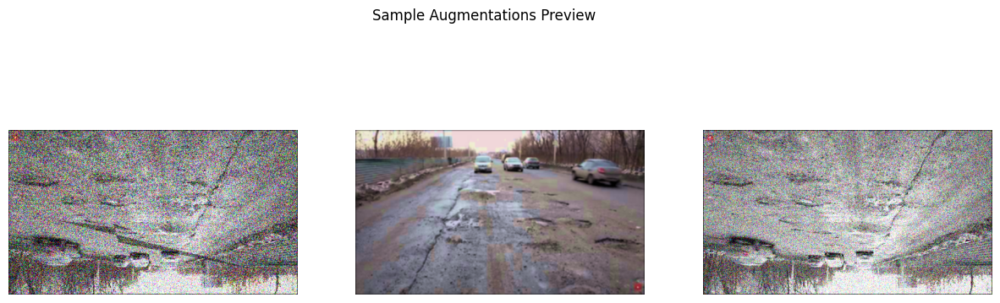

Ultralytics 8.3.118 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/yolo_data/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=ram, device=None, workers=4, project=None, name=augmented_train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=

train: Scanning /kaggle/working/yolo_data/labels/train... 497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 497/497 [00:00<00:00, 1032.43it/s]

train: New cache created: /kaggle/working/yolo_data/labels/train.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.5GB RAM): 100%|██████████| 497/497 [00:07<00:00, 69.95it/s] 

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2575.7±2329.3 MB/s, size: 1719.5 KB)


val: Scanning /kaggle/working/yolo_data/labels/valid... 93 images, 0 backgrounds, 0 corrupt: 100%|██████████| 93/93 [00:00<00:00, 995.17it/s]

val: New cache created: /kaggle/working/yolo_data/labels/valid.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 93/93 [00:01<00:00, 61.54it/s] 


Plotting labels to runs/detect/augmented_train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/augmented_train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.23G      2.299      3.111      2.066         12        640: 100%|██████████| 32/32 [00:07<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]


                   all         93        239    0.00503      0.272     0.0216    0.00425

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50       2.6G      1.986      2.414      1.831         13        640: 100%|██████████| 32/32 [00:05<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.14it/s]

                   all         93        239      0.237     0.0502     0.0755     0.0232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.61G      1.927      2.308      1.811          4        640: 100%|██████████| 32/32 [00:05<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.54it/s]


                   all         93        239     0.0894     0.0753     0.0224    0.00755

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.61G      1.907      2.211      1.813          3        640: 100%|██████████| 32/32 [00:05<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.37it/s]

                   all         93        239      0.283      0.234      0.162      0.042



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.61G       1.89      2.098      1.809         14        640: 100%|██████████| 32/32 [00:05<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.56it/s]

                   all         93        239       0.29      0.297      0.146      0.048



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.61G      1.849      2.091      1.788         20        640: 100%|██████████| 32/32 [00:05<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.35it/s]

                   all         93        239      0.299      0.339      0.216     0.0681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.61G      1.858      2.029      1.738         13        640: 100%|██████████| 32/32 [00:05<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.36it/s]

                   all         93        239      0.303      0.272      0.214     0.0728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.61G      1.864      2.008      1.781          9        640: 100%|██████████| 32/32 [00:05<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.95it/s]

                   all         93        239      0.451      0.339       0.31     0.0951



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.61G        1.8      1.921      1.711          7        640: 100%|██████████| 32/32 [00:05<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]


                   all         93        239      0.457      0.356      0.317     0.0988

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.61G      1.794      1.932       1.72          6        640: 100%|██████████| 32/32 [00:05<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.63it/s]

                   all         93        239      0.511      0.425      0.412       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.61G      1.802      1.894      1.733          7        640: 100%|██████████| 32/32 [00:05<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.73it/s]

                   all         93        239      0.574      0.393      0.401      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.61G      1.805       1.84      1.704         13        640: 100%|██████████| 32/32 [00:05<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.83it/s]

                   all         93        239      0.488      0.459      0.379      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.61G       1.78      1.855      1.703         28        640: 100%|██████████| 32/32 [00:05<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.84it/s]

                   all         93        239      0.564      0.414      0.411      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.61G      1.767      1.811      1.678          5        640: 100%|██████████| 32/32 [00:05<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.37it/s]

                   all         93        239      0.527      0.423      0.418      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.61G      1.757      1.818      1.684          7        640: 100%|██████████| 32/32 [00:05<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.13it/s]

                   all         93        239      0.499      0.413      0.376      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.61G      1.707      1.793       1.69          3        640: 100%|██████████| 32/32 [00:05<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.50it/s]


                   all         93        239      0.467      0.414      0.367      0.123

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.61G      1.733      1.771       1.67         19        640: 100%|██████████| 32/32 [00:05<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.03it/s]

                   all         93        239      0.532      0.456      0.409      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.61G      1.774      1.764      1.679          4        640: 100%|██████████| 32/32 [00:05<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.50it/s]

                   all         93        239      0.511      0.447      0.424      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.61G      1.707      1.718      1.647         13        640: 100%|██████████| 32/32 [00:05<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.91it/s]


                   all         93        239      0.592      0.477      0.464      0.168

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.61G      1.723      1.735       1.68          4        640: 100%|██████████| 32/32 [00:05<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.65it/s]

                   all         93        239      0.657      0.465       0.49      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.61G      1.713      1.713      1.653         14        640: 100%|██████████| 32/32 [00:05<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.04it/s]

                   all         93        239      0.676      0.446        0.5      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.61G      1.684      1.681      1.644          4        640: 100%|██████████| 32/32 [00:05<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.89it/s]

                   all         93        239      0.625       0.46       0.49      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.61G        1.7      1.697      1.621          2        640: 100%|██████████| 32/32 [00:05<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.51it/s]

                   all         93        239      0.586      0.469      0.465      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.61G       1.72      1.718      1.664          7        640: 100%|██████████| 32/32 [00:05<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.08it/s]

                   all         93        239      0.594      0.506      0.458      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.61G      1.668      1.639      1.626          8        640: 100%|██████████| 32/32 [00:05<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.92it/s]

                   all         93        239      0.669      0.534      0.546      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.61G      1.644      1.607      1.602         13        640: 100%|██████████| 32/32 [00:05<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.00it/s]

                   all         93        239      0.546      0.431       0.41      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.61G      1.662      1.662      1.622          5        640: 100%|██████████| 32/32 [00:05<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.81it/s]

                   all         93        239      0.675      0.452      0.489      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.61G      1.671      1.691      1.641          1        640: 100%|██████████| 32/32 [00:05<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.86it/s]

                   all         93        239      0.652      0.439      0.472      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.61G      1.651      1.645      1.592          9        640: 100%|██████████| 32/32 [00:05<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.06it/s]

                   all         93        239      0.658      0.481      0.525       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.61G      1.631      1.562      1.576         17        640: 100%|██████████| 32/32 [00:05<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.84it/s]

                   all         93        239      0.673      0.498      0.549      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.61G      1.667      1.668      1.597          3        640: 100%|██████████| 32/32 [00:05<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.04it/s]

                   all         93        239      0.625      0.508       0.53      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.61G      1.593      1.501      1.547         11        640: 100%|██████████| 32/32 [00:05<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.80it/s]

                   all         93        239      0.633      0.519      0.529      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.61G       1.62      1.536      1.565          7        640: 100%|██████████| 32/32 [00:05<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.18it/s]

                   all         93        239       0.62       0.51      0.498      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.61G      1.615      1.476      1.558         10        640: 100%|██████████| 32/32 [00:05<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.03it/s]

                   all         93        239      0.694       0.59      0.611      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.61G      1.678      1.587      1.623         17        640: 100%|██████████| 32/32 [00:05<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.52it/s]

                   all         93        239      0.669      0.536      0.537      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.61G      1.629       1.55      1.591         18        640: 100%|██████████| 32/32 [00:05<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.80it/s]

                   all         93        239      0.743      0.531      0.591      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.61G      1.602      1.486      1.571          5        640: 100%|██████████| 32/32 [00:05<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.63it/s]

                   all         93        239       0.71      0.531      0.597      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.61G      1.594      1.502       1.57         23        640: 100%|██████████| 32/32 [00:05<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.76it/s]

                   all         93        239      0.746       0.54      0.595       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.61G      1.599       1.48      1.558          9        640: 100%|██████████| 32/32 [00:05<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         93        239      0.725      0.577      0.613      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.61G      1.559      1.455      1.545          4        640: 100%|██████████| 32/32 [00:05<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.92it/s]


                   all         93        239       0.68      0.525      0.556      0.196
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.61G      1.784      2.237      1.533          2        640: 100%|██████████| 32/32 [00:05<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.86it/s]

                   all         93        239      0.682      0.515      0.554      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.61G      1.669      1.645      1.501          1        640: 100%|██████████| 32/32 [00:04<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.66it/s]

                   all         93        239      0.703      0.484      0.509      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.61G      1.676      1.509      1.491          2        640: 100%|██████████| 32/32 [00:04<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.59it/s]

                   all         93        239      0.697      0.556      0.589      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.61G      1.676      1.544      1.518          1        640: 100%|██████████| 32/32 [00:04<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.23it/s]


                   all         93        239      0.726      0.569      0.589      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.61G      1.633      1.463      1.453          5        640: 100%|██████████| 32/32 [00:04<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.83it/s]

                   all         93        239      0.705      0.577      0.613      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.61G      1.575       1.46      1.428          2        640: 100%|██████████| 32/32 [00:04<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.91it/s]

                   all         93        239      0.671      0.588      0.619      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.61G      1.656      1.389      1.422          2        640: 100%|██████████| 32/32 [00:04<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.74it/s]

                   all         93        239      0.699      0.586      0.627      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.61G       1.59      1.327      1.423          1        640: 100%|██████████| 32/32 [00:04<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.67it/s]

                   all         93        239      0.699      0.613      0.632       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.61G      1.678      1.441      1.422          2        640: 100%|██████████| 32/32 [00:04<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.96it/s]

                   all         93        239      0.722      0.598      0.635      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.61G      1.575       1.28      1.419          1        640: 100%|██████████| 32/32 [00:05<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.16it/s]

                   all         93        239      0.709      0.598      0.628       0.25



50 epochs completed in 0.089 hours.
Optimizer stripped from runs/detect/augmented_train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/augmented_train2/weights/best.pt, 6.2MB

Validating runs/detect/augmented_train2/weights/best.pt...
Ultralytics 8.3.118 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


                   all         93        239      0.672      0.552      0.601      0.274
             plot_hole         93        239      0.672      0.552      0.601      0.274


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 8.8ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/augmented_train2

image 1/64 /kaggle/working/yolo_data/images/test/G0010124.JPG: 480x640 (no detections), 123.0ms
image 2/64 /kaggle/working/yolo_data/images/test/G0010760.JPG: 480x640 1 plot_hole, 21.1ms
image 3/64 /kaggle/working/yolo_data/images/test/G0010770.JPG: 480x640 1 plot_hole, 20.3ms
image 4/64 /kaggle/working/yolo_data/images/test/G0011427.JPG: 480x640 (no detections), 20.6ms
image 5/64 /kaggle/working/yolo_data/images/test/G0011621.JPG: 480x640 (no detections), 20.2ms
image 6/64 /kaggle/working/yolo_data/images/test/G0011764.JPG: 480x640 1 plot_hole, 19.8ms
image 7/64 /kaggle/working/yolo_data/images/test/G0011766.JPG: 480x640 (no detections), 20.3ms
image 8/64 /kaggle/working/yolo_data/images/test/G0020197.JPG: 480x640 (no detections), 20.1ms
image 9/64 /kaggle/working/yolo_data/images/test/G0020206.JPG: 480x640 (no detections), 20.2ms
image 10/64 /kaggle/working

In [ ]:
import os
import shutil
import albumentations as A
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Step 1: Data Augmentation Setup (Enhanced)
augmentation_params = {
    'hsv_h': 0.05,
    'hsv_s': 0.7,
    'hsv_v': 0.5,
    'degrees': 20.0,
    'translate': 0.2,
    'scale': 0.3,
    'shear': 5.0,
    'perspective': 0.002,
    'fliplr': 0.5,
    'flipud': 0.3,
    'mosaic': 1.0,
    'mixup': 0.3,
    'copy_paste': 0.25,
    'erasing': 0.3,
    'auto_augment': 'randaugment'
}

# Step 2: Setup Model (Load Pretrained YOLOv8)
model = YOLO('yolov8n.pt')  # You can switch to yolov8s or yolov8m for a larger model

# Step 3: Dataset Organization & Augmentation Function (Including Preview)
def organize_dataset(source_path, target_dir, split_name):
    """Organizes dataset with augmentation preview"""
    img_dir = f'{target_dir}/images/{split_name}'
    lbl_dir = f'{target_dir}/labels/{split_name}'
    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(lbl_dir, exist_ok=True)
    
    preview_shown = False
    
    for root, _, files in os.walk(source_path):
        for file in files:
            src = os.path.join(root, file)
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                shutil.copy(src, f'{img_dir}/{file}')
                if not preview_shown and split_name == 'train':
                    show_augmentation_preview(src)
                    preview_shown = True
            elif file.endswith('.txt'):
                shutil.copy(src, f'{lbl_dir}/{file}')

def show_augmentation_preview(image_path):
    """Displays sample augmentations"""
    import cv2
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    transform = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.2),
        A.RandomRotate90(p=0.3),
        A.RandomBrightnessContrast(p=0.4),
        A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
        A.CLAHE(p=0.2),
        A.Blur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.ToGray(p=0.1),
        A.RandomShadow(p=0.1),
        A.RandomSunFlare(p=0.1),
        A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
        A.MotionBlur(blur_limit=5, p=0.2),
    ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))
    
    plt.figure(figsize=(15, 5))
    for i in range(3):
        transformed = transform(image=img, bboxes=[[0.5,0.5,0.2,0.2]], class_labels=[0])
        plt.subplot(1, 3, i+1)
        plt.imshow(transformed['image'])
        plt.axis('off')
    plt.suptitle('Sample Augmentations Preview')
    plt.show()

# Step 4: Organize Dataset
dataset_path = '/kaggle/working/yolo_data'
os.makedirs(dataset_path, exist_ok=True)

organize_dataset('/kaggle/input/data-set/train/train/train', dataset_path, 'train')
organize_dataset('/kaggle/input/data-set/valid/valid/valid', dataset_path, 'valid')
organize_dataset('/kaggle/input/data-set/test/test/test', dataset_path, 'test')

# Step 5: Create YAML File for YOLOv8
with open(f'{dataset_path}/data.yaml', 'w') as f:
    f.write(f"""
path: {dataset_path}
train: images/train
val: images/valid
test: images/test

names:
  0: plot_hole
  1: defect
""")

# Step 6: Train Model for 50 Epochs (Including Augmentations)
results = model.train(
    data=f'{dataset_path}/data.yaml',
    epochs=50,             # Initial training
    imgsz=640,
    batch=16,
    cache='ram',
    workers=4,
    name='augmented_train',
    augment=True,
    **augmentation_params
)

# Step 7: Pseudo-Labeling on Test Set
pseudo_output_dir = '/kaggle/working/pseudo_labels'
os.makedirs(pseudo_output_dir, exist_ok=True)
model.predict(
    source='/kaggle/working/yolo_data/images/test', 
    save_txt=True, 
    save_conf=True, 
    project=pseudo_output_dir,
    name='pseudo',
    conf=0.3
)

# Step 8: Move Pseudo-Labels into Train Set and Fine-Tune for 10 More Epochs
pseudo_labels = f'{pseudo_output_dir}/pseudo/labels'
train_labels = '/kaggle/working/yolo_data/labels/train'
for file in os.listdir(pseudo_labels):
    shutil.copy(os.path.join(pseudo_labels, file), os.path.join(train_labels, file))

# Fine-tune for 10 more epochs using pseudo-labeled data
model.train(
    data=f'{dataset_path}/data.yaml',
    epochs=10,  # Fine-tune with pseudo-labels
    imgsz=640,
    batch=16,
    name='fine_tuned_model',
    cache='ram',
    workers=4,
    augment=True,
    **augmentation_params
)

# Step 9: Evaluate Model with Test-Time Augmentation (TTA)
metrics = model.val(
    data=f'{dataset_path}/data.yaml',
    augment=True,  # TTA enabled
    conf=0.3,
    iou=0.6
)

print(f"\n✅ Final mAP50: {metrics.box.map50:.4f}")
print(f"✅ Final mAP50-95: {metrics.box.map:.4f}")


In [5]:
# 1. Import libraries
from ultralytics import YOLO
import pandas as pd
import os
import cv2

# 2. Load the trained model (adjust path if needed)
model = YOLO('/kaggle/working/runs/detect/augmented_train2/weights/best.pt')  # <-- your model

# 3. Setup for submission
submission_data = []
test_images_path = '/kaggle/working/yolo_data/images/test'

# 4. Predict on each test image
for img_name in os.listdir(test_images_path):
    if not img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue

    img_path = os.path.join(test_images_path, img_name)
    img = cv2.imread(img_path)
    img_height, img_width = img.shape[:2]

    results = model.predict(img_path, conf=0.3, iou=0.6)

    # Collect bounding boxes (xyxyn = normalized)
    for i, box in enumerate(results[0].boxes.xyxyn.cpu().numpy()):
        xmin, ymin, xmax, ymax = box[:4]
        submission_data.append({
            'unique_id': f"{os.path.splitext(img_name)[0]}_{i}",
            'image_id': os.path.splitext(img_name)[0],
            'xmin': round(xmin, 6),
            'ymin': round(ymin, 6),
            'xmax': round(xmax, 6),
            'ymax': round(ymax, 6)
        })

# 5. Save to CSV
submission_df = pd.DataFrame(submission_data)
csv_path = '/kaggle/working/submission.csv'
submission_df.to_csv(csv_path, index=False, float_format='%.6f')

print(f"✅ Submission saved to {csv_path} with {len(submission_df)} predictions.")
print("📌 Sample rows:")
print(submission_df.head())



image 1/1 /kaggle/working/yolo_data/images/test/G0101524.JPG: 480x640 (no detections), 7.4ms
Speed: 2.7ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/yolo_data/images/test/img-294_jpg.rf.a16953e9091e3eecfc338ed3044ef294.jpg: 384x640 1 plot_hole, 6.8ms
Speed: 1.4ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0027282.JPG: 480x640 1 plot_hole, 7.2ms
Speed: 2.7ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/yolo_data/images/test/img-472_jpg.rf.d71e2cae627685f2ad46e4182bbfb68a.jpg: 384x640 2 plot_holes, 7.5ms
Speed: 1.5ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/yolo_data/images/test/G0022107.JPG: 480x640 1 plot_hole, 7.2ms
Speed: 2.6ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 